# Imports and setup

In [819]:
import os
import time
from scipy import stats
import scipy.constants as const
import matplotlib.gridspec as gridspec
from UTILITY_quickstart import *

## Define plotting helpers

In [2]:
formatter = plt.ScalarFormatter(useMathText=True)
formatter.set_scientific(True)
formatter.set_powerlimits((-1,1))

# nominal bmad params
importedDefaultSettings = loadConfig(f'setLattice_configs/2025-02-25_oneBunch_baseline.yml')
nominal_L0B_Phase       = importedDefaultSettings['L0BPhaseSet']
nominal_L0BF_Amp        = 5.95e7
nominal_L1_Phase        = importedDefaultSettings['L1PhaseSet']
nominal_L1_Amp          = 0.335e9 - 0.125e9
nominal_L2_Phase        = importedDefaultSettings['L2PhaseSet']
nominal_L2_Amp          = 4.5e9 - 0.335e9
nominal_L3_Phase        = importedDefaultSettings['L3PhaseSet']
nominal_L3_Amp          = 10.0e9 - 4.5e9

jitter_params = {
    'L0BPhaseSet':     nominal_L0B_Phase,
    'L1PhaseSet':      nominal_L1_Phase,
    'L2PhaseSet':      nominal_L2_Phase,
    'L3PhaseSet':      nominal_L3_Phase,
    'L0BEnergyOffset': nominal_L0BF_Amp,
    'L1EnergyOffset':  nominal_L1_Amp,
    'L2EnergyOffset':  nominal_L2_Amp,
    'L3EnergyOffset':  nominal_L3_Amp,
}

TDR_boxplot_labels = {
    'L0BPhaseSet':     'L0B Phase',
    'L1PhaseSet':      'L1 Phase',
    'L2PhaseSet':      'L2 Phase',
    'L3PhaseSet':      'L3 Phase',
    'L0BEnergyOffset': 'L0B Energy',
    'L1EnergyOffset':  'L1 Energy',
    'L2EnergyOffset':  'L2 Energy',
    'L3EnergyOffset':  'L3 Energy',
    'All':             'All',
}

jitter_labels = {
    'L0BPhaseSet':     'L0B Phase [deg]',
    'L1PhaseSet':      'L1 Phase [deg]',
    'L2PhaseSet':      'L2 Phase [deg]',
    'L3PhaseSet':      'L3 Phase [deg]',
    'L0BEnergyOffset': 'L0B Energy [MeV]',
    'L1EnergyOffset':  'L1 Energy [MeV]',
    'L2EnergyOffset':  'L2 Energy [GeV]',
    'L3EnergyOffset':  'L3 Energy [GeV]',
}

jitter_scale = {
    'L0BPhaseSet':     1,
    'L1PhaseSet':      1,
    'L2PhaseSet':      1,
    'L3PhaseSet':      1,
    'L0BEnergyOffset': 1e-6,
    'L1EnergyOffset':  1e-6,
    'L2EnergyOffset':  1e-9,
    'L3EnergyOffset':  1e-9,
}

key_label_dict = {
    'energy'             : 'Mean energy [GeV]',
    'peak current 50'    : 'Peak current (50 bins) [kA]',
    'peak current 100'   : 'Peak current (100 bins) [kA]',
    'peak current 200'   : 'Peak current (200 bins) [kA]',
    'sigma_x'            : r'RMS horizontal spot size [$\mu m$]',
    'sigma_y'            : r'RMS vertical spot size [$\mu m$]',
    'sigma_z'            : r'RMS bunch length [$\mu m$]',
    'emittance_x'        : r'Normalized $\varepsilon_x$ [$\mu m$]',
    'emittance_y'        : r'Normalized $\varepsilon_y$ [$\mu m$]',
    'pmd_emittance_x'    : r'Built-in pmd normalized $\varepsilon_x$ [$\mu m$]',
    'pmd_emittance_y'    : r'Built-in pmd normalized $\varepsilon_y$ [$\mu m$]',
    'energy spread'      : r'Energy spread [%]',
}

key_scale_dict = {
    'energy'             : 1e-9,
    'peak current 50'    : 1e-3,
    'peak current 100'   : 1e-3,
    'peak current 200'   : 1e-3,
    'sigma_x'            : 1e6,
    'sigma_y'            : 1e6,
    'sigma_z'            : 1e6,
    'emittance_x'        : 1e6,
    'emittance_y'        : 1e6,
    'pmd_emittance_x'    : 1e6,
    'pmd_emittance_y'    : 1e6,
    'energy spread'      : 1e2,
}


def TDRBoxPlot(val, positions=None, widths=None):
    boxprops     = dict(color='b')
    medianprops  = dict(color='r')
    flierprops   = dict(markeredgecolor='r', marker='+')
    whiskerprops = dict(linestyle='--')
    
    plt.boxplot(val,
                notch=True,
                boxprops=boxprops,
                medianprops=medianprops,
                flierprops=flierprops,
                whiskerprops=whiskerprops,
                positions=positions,
                widths=widths
               )
    return

def sci():
    ax=plt.gca()
    ax.yaxis.set_major_formatter(formatter)
    return

def stat_convergence(diags, key, location='PENT', factor=3, plot=False, return_data=False):
    sample_sizes = [ int(len(diags) / 10**(i/factor)) for i in range(factor * int(np.log10(len(diags))) + 1) ]
    samples      = [ random.sample(list(diags.keys()), k=sample_size) for sample_size in sample_sizes ]

    if plot:
        plot_data = [ [ diags[sample][location][key] * key_scale_dict[key] for sample in samples[i] ] for i in range(len(samples)) ]
        
        # Adjust widths for log scale
        log_sample_sizes = np.log10(sample_sizes)
        width_ratios = np.diff(log_sample_sizes)
        widths = np.concatenate((width_ratios, [width_ratios[-1]]))  # Add one more width ratio for the last plot
        
        TDRBoxPlot(plot_data, positions=sample_sizes, widths=np.divide(sample_sizes, 2))
        plt.xscale('log')
        # plt.gca().invert_xaxis()
        plt.xlabel('Sample size')
        plt.ylabel(key_label_dict[key])


        
        plt.show()
    
    if return_data:
        means  = [ np.mean([ diags[sample][location][key] * key_scale_dict[key] for sample in samples[i] ]) for i in range(len(samples)) ]
        sigmas = [ np.std([ diags[sample][location][key] * key_scale_dict[key] for sample in samples[i] ]) for i in range(len(samples)) ]
        
        return means, sigmas, samples

def summary_scatter_plots(L_str: str, jitter_param: str, location: str = 'PENT', show=True, return_ax=False):
    '''
    Parameters
    ----------
        L_str : str
            Linac section identifier. Should be one of: `L0B`, `L1`, `L2`, `L3`
        jitter_param : str
            Set the parameter of the linac that was jittered. Should be either `phase` or `amplitude`
        location : str
            Set the beam output location you want to look at. Default `PENT`.
    '''
    
    plot_keys = [ key for key in key_label_dict.keys() if key not in ['peak current 50', 'peak current 200', 'pmd_emittance_x', 'pmd_emittance_y'] ]
    
    fig,ax = plt.subplots(nrows=2, ncols=4, sharex=True, gridspec_kw = {'wspace': .25, 'hspace': .05}, figsize=(24,8), dpi=500)
    
    for idx,key in enumerate(plot_keys):
        row_idx = idx // 4
        col_idx = idx % 4
        
        if jitter_param.lower() == 'phase':
            jitter_key = 'PhaseSet'
            jitter_x_axis_label = 'phase [deg]'
            jitter_scale = 1
        elif jitter_param.lower() == 'amplitude':
            jitter_key = 'EnergyOffset'
            jitter_x_axis_label = 'energy offset [MeV]'
            jitter_scale = 1e-6
        else:
            print('Invalid kwarg. Please enter either `phase` or `amplitude`.')
            plt.close()
            return
        
        ax[row_idx, col_idx].scatter(xopt_out[f'{L_str}{jitter_key}'] * jitter_scale,
                        gather_diagnostics(location, key, xopt_out),
                        s=1
                       )
        ax[row_idx, col_idx].set_ylabel(key_label_dict[key], fontsize=14)
            
        if row_idx == 1:
            ax[row_idx, col_idx].set_xlabel(f'{L_str} {jitter_x_axis_label}', fontsize=14)
    
    if show:
        plt.show()

    if return_ax:
        return ax

def full_summary_scatter_plots(L_str: str, jitter_param: str, location: str = 'PENT', show=True, return_ax=False, ncols=3):
    '''
    Parameters
    ----------
        L_str : str
            Linac section identifier. Should be one of: `L0B`, `L1`, `L2`, `L3`
        jitter_param : str
            Set the parameter of the linac that was jittered. Should be either `phase` or `amplitude`
        location : str
            Set the beam output location you want to look at. Default `PENT`.
    '''
    
    plot_keys = [ key for key in key_label_dict.keys() if key not in ['peak current 50', 'peak current 200', 'pmd_emittance_x', 'pmd_emittance_y'] ]
    
    fig,ax = plt.subplots(nrows=2, ncols=4, sharex=True, gridspec_kw = {'wspace': .25, 'hspace': .05}, figsize=(24,8), dpi=500)
    
    for idx,key in enumerate(plot_keys):
        row_idx = idx // 4
        col_idx = idx % 4
        
        if jitter_param.lower() == 'phase':
            jitter_key = 'PhaseSet'
            jitter_x_axis_label = 'phase [deg]'
            jitter_scale = 1
        elif jitter_param.lower() == 'amplitude':
            jitter_key = 'EnergyOffset'
            jitter_x_axis_label = 'energy offset [MeV]'
            jitter_scale = 1e-6
        else:
            print('Invalid kwarg. Please enter either `phase` or `amplitude`.')
            plt.close()
            return
        
        if 'peak current' in key:
            for bins in [50, 100, 200]:
                ax[row_idx, col_idx].scatter(xopt_out[f'{L_str}{jitter_key}'] * jitter_scale,
                                gather_diagnostics(location, f'peak current {bins}', xopt_out),
                                s=1,
                                label=bins
                               )
            ax[row_idx, col_idx].set_ylabel('Peak current [kA]', fontsize=14)
            ax[row_idx, col_idx].legend(title='Number of bins', title_fontsize='large', ncols=ncols, markerscale=4)
            
        elif 'emittance' in key:
            ax[row_idx, col_idx].scatter(xopt_out[f'{L_str}{jitter_key}'] * jitter_scale,
                            gather_diagnostics(location, key, xopt_out),
                            s=1,
                            label='N. Majernik calc.'
                           )
            ax[row_idx, col_idx].set_ylabel(key_label_dict[key], fontsize=14)
            
            ax[row_idx, col_idx].scatter(xopt_out[f'{L_str}{jitter_key}'] * jitter_scale,
                        gather_diagnostics(location, 'pmd_' + key, xopt_out),
                        s=1,
                        label='PMD built-in'
                       )
            ax[row_idx, col_idx].legend(markerscale=4)
            
        else:
            ax[row_idx, col_idx].scatter(xopt_out[f'{L_str}{jitter_key}'] * jitter_scale,
                            gather_diagnostics(location, key, xopt_out),
                            s=1
                           )
            ax[row_idx, col_idx].set_ylabel(key_label_dict[key], fontsize=14)
            
        if row_idx == 1:
            ax[row_idx, col_idx].set_xlabel(f'{L_str} {jitter_x_axis_label}', fontsize=14)
    
    if show:
        plt.show()

    if return_ax:
        return ax

## Combine beam diagnostics at given location

In [3]:
def gather_diagnostics(location: str, key: str, dataFrame) -> list:
    return [ diagnostics[dataFrame['Unique ID'].iloc[i]][location][key]*key_scale_dict[key] for i in range(dataFrame['Unique ID'].size) ]

## Gather unique ID's

In [4]:
# no need to use this
def gather_UID(path: str) -> list:
    return [ f.name for f in os.scandir(path) if f.is_dir() and f.name != 'beams' ]

# Initialize and extract data 

In [4]:
L_str = 'L3'

# directory = f'/pscratch/sd/m/maxvarv/{L_str}_amp_jitter'
# xopt_out = pd.concat([ pd.read_csv(f'{directory}/xopt_out_{i}.csv') for i in range(9)] , ignore_index=True)

directory = f'/pscratch/sd/m/maxvarv/Linac_phase_amp_jitter_2025_03_17'
xopt_out = pd.concat([ pd.read_csv(f'{directory}/xopt_out_{i}.csv') for i in range(10)] , ignore_index=True)

# filter out any incomplete sims (be careful with this, it's possible that an error was thrown but the simulation finished and is okay)
xopt_out = xopt_out[xopt_out['xopt_error'] == False]

# extract beam diagnostics from each run by the unique ID
diagnostics = {}
for uid in xopt_out['Unique ID']:
    try:
        diagnostics[uid] = pd.read_csv(f'{directory}/{uid}/diagnostics.csv', index_col=0)
    except:
        print(f'{uid} not imported!')


%time

CPU times: user 3 μs, sys: 1 μs, total: 4 μs
Wall time: 10.5 μs


In [5]:
len(diagnostics)

50040

In [4]:
# only run if this is the jitter reference does not already exist

# directory = '/pscratch/sd/m/maxvarv/Linac_phase_amp_jitter_2025_03_17'

for L_str in [ 'L0B', 'L1', 'L2', 'L3' ]:
    for param in ['phase', 'amp']:
        directory = f'/pscratch/sd/m/maxvarv/{L_str}_{param}_jitter'

        xopt_out = pd.concat([ pd.read_csv(f'{directory}/xopt_out_{i}.csv') for i in range(9)] , ignore_index=True)
        
        # filter out any incomplete sims (be careful with this, it's possible that an error was thrown but the simulation finished and is okay)
        xopt_out = xopt_out[xopt_out['xopt_error'] == False]
        
        xopt_out.to_csv(f'{directory}/jitter_reference.csv', index=False)

# Simulation comparisons

### Compile all the data

In [4]:
L_str_list = [ 'L0B', 'L1', 'L2', 'L3' ]

def phase_dir(L_str): return f'/pscratch/sd/m/maxvarv/{L_str}_phase_jitter'
def amp_dir(L_str): return f'/pscratch/sd/m/maxvarv/{L_str}_amp_jitter'
all_directory = f'/pscratch/sd/m/maxvarv/Linac_phase_amp_jitter_2025_03_17'

oneDim_xopt_outs = {}
diagnostics = {}

for L_string in L_str_list:
    print(L_string)
    oneDim_xopt_outs[L_string + ' phase'] = pd.concat([ pd.read_csv(f'{phase_dir(L_string)}/xopt_out_{i}.csv') for i in range(9)] , ignore_index=True)
    oneDim_xopt_outs[L_string + ' phase'] = oneDim_xopt_outs[L_string + ' phase'][oneDim_xopt_outs[L_string + ' phase']['xopt_error'] == False]
    diagnostics[L_string + ' phase'] = {}
    for uid in oneDim_xopt_outs[L_string + ' phase']['Unique ID']:
        try:
            diagnostics[L_string + ' phase'][uid] = pd.read_csv(f'{phase_dir(L_string)}/{uid}/diagnostics.csv', index_col=0)
        except:
            print(f'{uid} not imported!')
    
    oneDim_xopt_outs[L_string + ' amp']   = pd.concat([ pd.read_csv(f'{amp_dir(L_string)  }/xopt_out_{i}.csv') for i in range(9)] , ignore_index=True)
    oneDim_xopt_outs[L_string + ' amp']   = oneDim_xopt_outs[L_string + ' amp'][oneDim_xopt_outs[L_string + ' amp']['xopt_error'] == False]
    diagnostics[L_string + ' amp'] = {}
    for uid in oneDim_xopt_outs[L_string + ' amp']['Unique ID']:
        try:
            diagnostics[L_string + ' amp'][uid] = pd.read_csv(f'{amp_dir(L_string)}/{uid}/diagnostics.csv', index_col=0)
        except:
            print(f'{uid} not imported!')

print('Importing xopt_out from `All` jitter')
oneDim_xopt_outs['All'] = pd.concat([ pd.read_csv(f'{all_directory}/xopt_out_{i}.csv') for i in range(10)] , ignore_index=True)
diagnostics['All'] = {}
for uid in oneDim_xopt_outs['All']['Unique ID']:
        try:
            diagnostics['All'][uid] = pd.read_csv(f'{all_directory}/{uid}/diagnostics.csv', index_col=0)
        except:
            print(f'{uid} not imported!')

L0B
L1
L2
L3
Importing xopt_out from `All` jitter


### 2D correlation grid

In [36]:
location = 'PENT'
diag_keys = [ key for key in key_label_dict.keys() if key not in ['peak current 50', 'peak current 200'] ]

dlist = list(diagnostics.keys())[:-1]
jitter_access_key = { key: val for key,val in zip(dlist[::2] + dlist[1::2], jitter_labels.keys()) }

pcf = np.zeros((8,10))


for i,jitter_param in enumerate(diagnostics.keys()):
    if jitter_param != 'All':
        for j,key in enumerate(diag_keys):
            pcf[i,j] = stats.pearsonr(
                                        oneDim_xopt_outs[jitter_param][jitter_access_key[jitter_param]],
                                        [ diagnostics[jitter_param][oneDim_xopt_outs[jitter_param]['Unique ID'].iloc[k]][location][key]*key_scale_dict[key] for k in range(oneDim_xopt_outs[jitter_param]['Unique ID'].size) ]
                                    ).statistic


    


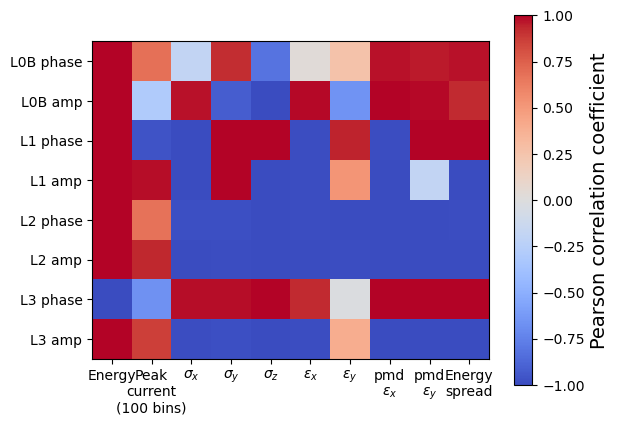

In [73]:
diag_labels = [
    'Energy',
    'Peak\ncurrent\n(100 bins)',
    r'$\sigma_x$',
    r'$\sigma_y$',
    r'$\sigma_z$',
    r'$\varepsilon_x$',
    r'$\varepsilon_y$',
    'pmd\n' + r'$\varepsilon_x$',
    'pmd\n' + r'$\varepsilon_y$',
    'Energy\nspread',
]

cmap = 'coolwarm'
img = plt.imshow(pcf, cmap=cmap, vmin=-1, vmax=1)
cb = plt.colorbar()
cb.set_label('Pearson correlation coefficient', fontsize=14)

plt.xticks(ticks=[i for i in range(pcf.shape[1])], labels=diag_labels, rotation=0)
plt.yticks(ticks=[i for i in range(pcf.shape[0])], labels=dlist)

plt.show()

### TDR-style box plots

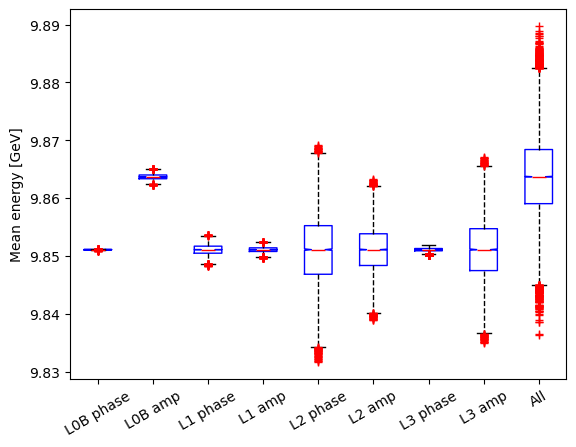

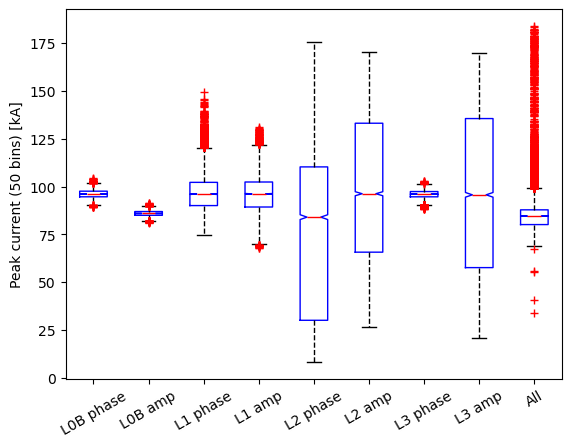

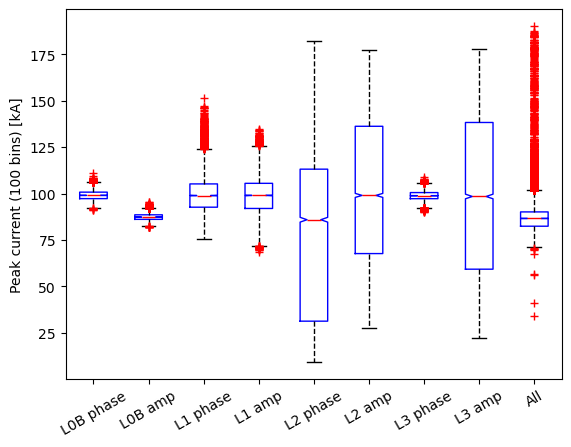

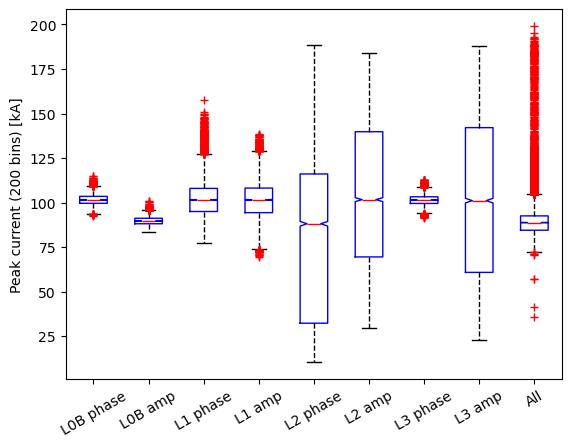

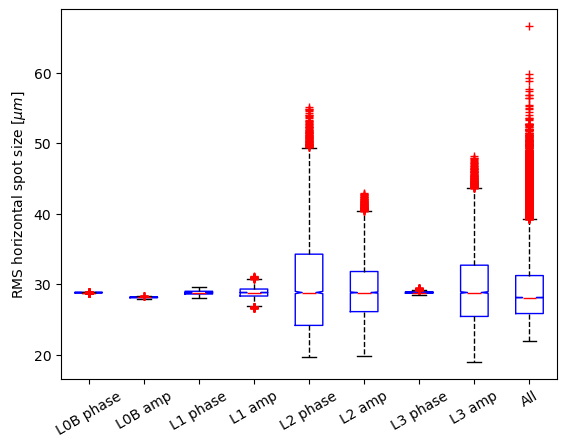

...

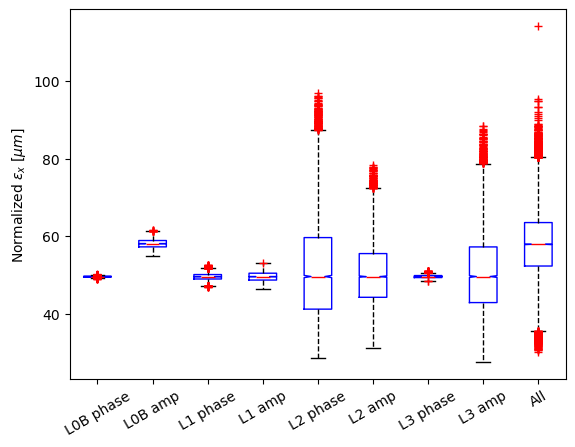

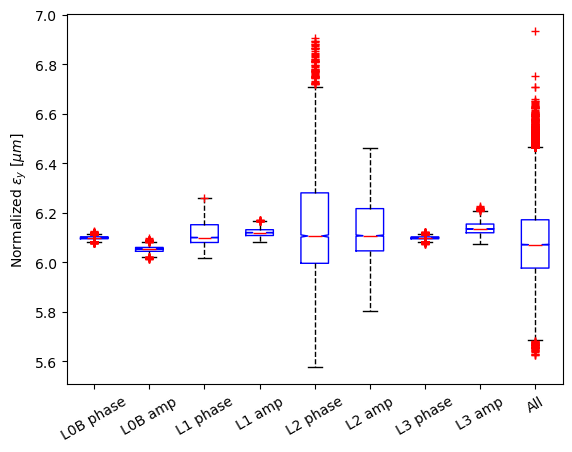

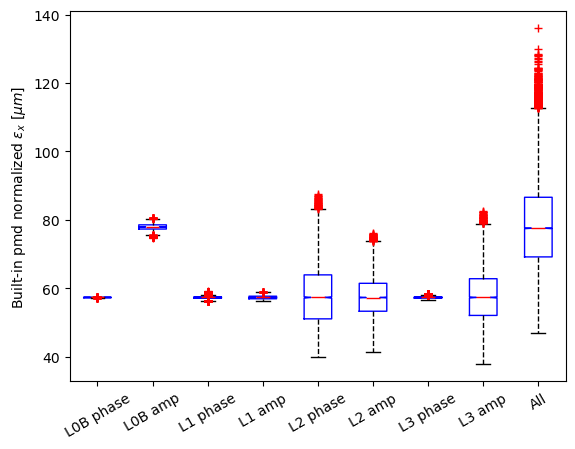

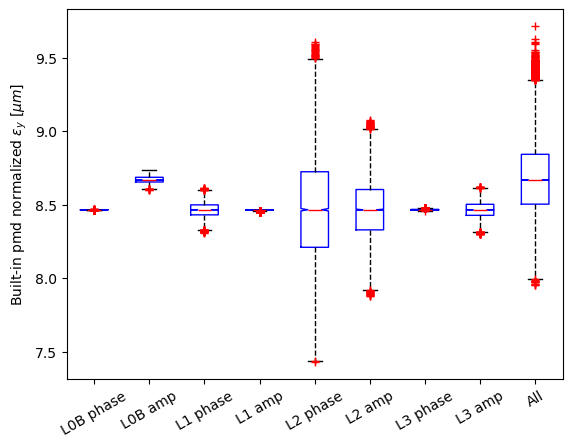

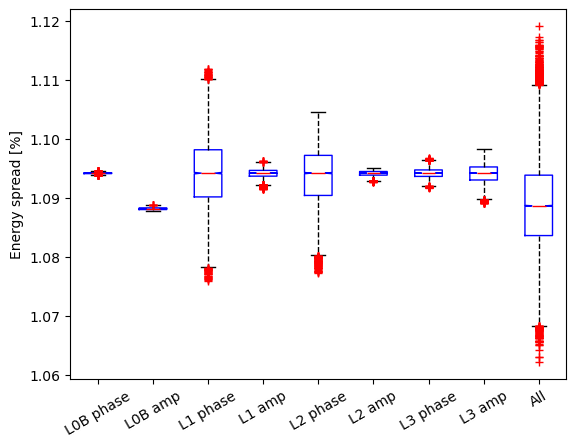

In [110]:
location = 'PENT'

for key in key_label_dict.keys():
    # diags = [ gather_diagnostics(location=location, key=key,dataFrame=diagnostics[diag_key]) for diag_key in diagnostics.keys() ]
    diags = [ [ diagnostics[diag_key][oneDim_xopt_outs[diag_key]['Unique ID'].iloc[i]][location][key]*key_scale_dict[key] for i in range(oneDim_xopt_outs[diag_key]['Unique ID'].size) ] for diag_key in diagnostics.keys() ]
            
    TDRBoxPlot(
        diags,
        # positions=list(diagnostics.keys()),
    )

    plt.xticks(ticks=[i for i in range(1,10)], labels=list(diagnostics.keys()), rotation=30)
    plt.ylabel(key_label_dict[key])
    plt.show()

# Visualize results

### Compute time

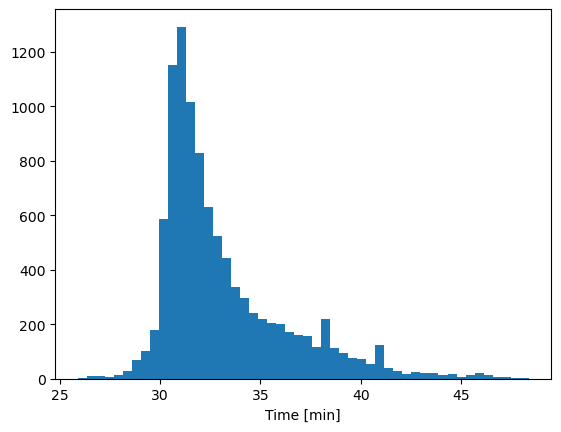

In [6]:
plt.hist(xopt_out['xopt_runtime']/60, bins=50)
plt.xlabel('Time [min]')
plt.show()

### 2D correlation plots (8D jitter sim)

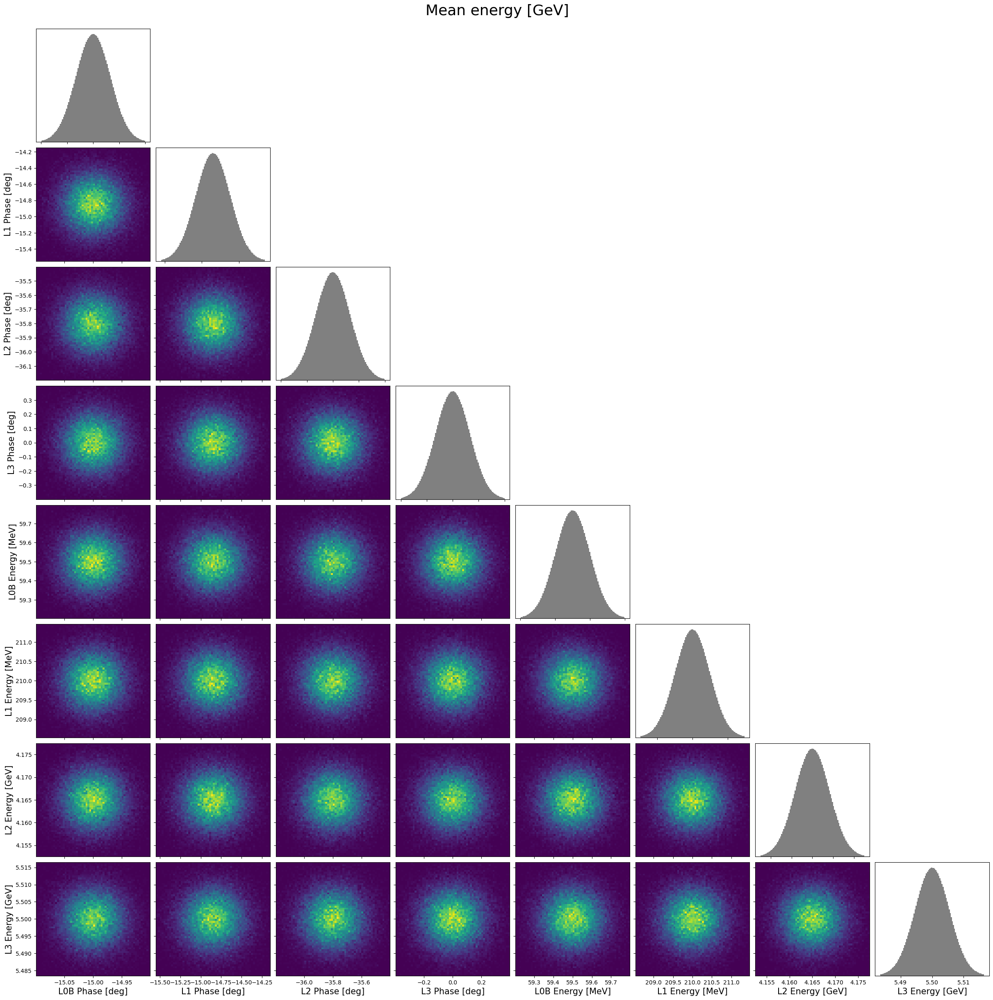

In [841]:
# from the 8D jitter sim

plot_keys = [ key for key in key_label_dict.keys() if key not in ['peak current 50', 'peak current 200', 'pmd_emittance_x', 'pmd_emittance_y'] ]
location = 'PENT'
bn = 60
dim = 8

for diagnostic_key in [plot_keys[0]]:
    fig, axs = plt.subplots(figsize=(30, 30), sharex='col', sharey='row', ncols=dim, nrows=dim, gridspec_kw = {'wspace': .05, 'hspace': .05})
    
    for i in range(dim):
        for j in range(dim):
            ax = axs[i,j]
            if i < j:
                ax.axis('off')            
            else:
                x_key = xopt_out.keys()[j]
                y_key = xopt_out.keys()[i]
                
                if i == j:
                    ax.remove()
                    ax = plt.subplot(dim, dim, i * dim + j + 1)
                    ax.hist(
                        (xopt_out[x_key] + jitter_params[x_key] * ('Energy' in x_key)) * jitter_scale[x_key],
                        weights=gather_diagnostics(location, diagnostic_key, xopt_out),
                        bins=100,
                        color='gray'
                    )
                    # ax.set_yticklabels([])
                    ax.set_yticks([])
                    # ax.set_xticks([])
                    if i == dim-1:
                        ax.set_xlabel(jitter_labels[x_key], fontsize=15)
                    else:
                        ax.set_xticklabels([])
                else:
                    # ax.scatter(
                    #    (xopt_out[x_key] + jitter_params[x_key] * ('Energy' in x_key)) * (key_scale_dict[diagnostic_key] if 'Energy' in x_key else 1),
                    #    (xopt_out[y_key] + jitter_params[y_key] * ('Energy' in y_key)) * (key_scale_dict[diagnostic_key] if 'Energy' in y_key else 1),
                    #     c=gather_diagnostics(location, diagnostic_key, xopt_out),
                    #     s=1,
                    #     cmap='viridis'
                    # )
                    
                    ax.hist2d(
                       (xopt_out[x_key] + jitter_params[x_key] * ('Energy' in x_key)) * jitter_scale[x_key],
                       (xopt_out[y_key] + jitter_params[y_key] * ('Energy' in y_key)) * jitter_scale[y_key],
                        weights=gather_diagnostics(location, diagnostic_key, xopt_out), bins=bn
                    )
                
                    if j == 0:
                        ax.set_ylabel(jitter_labels[y_key], fontsize=15)
                    if i == dim-1:
                        ax.set_xlabel(jitter_labels[x_key], fontsize=15)
    
    plt.suptitle(key_label_dict[diagnostic_key], fontsize=26, y=0.9)
    # plt.savefig(f'/global/homes/m/maxvarv/FACET2-Bmad-PyTao/figs/correlated_{diagnostic_key}.pdf', format='pdf')
    plt.show()

#### Normalize binning by sampling distribution (test)

In [929]:
x_key = 'L1PhaseSet'
y_key = 'L2PhaseSet'
diagnostic_key = 'energy'

(counts, x_edges, y_edges) = np.histogram2d(
    (xopt_out[x_key] + jitter_params[x_key] * ('Energy' in x_key)) * jitter_scale[x_key],
    (xopt_out[y_key] + jitter_params[y_key] * ('Energy' in y_key)) * jitter_scale[y_key],
    bins=100,
)

# (x_counts, x_edges) = np.histogram(
#     (xopt_out[x_key] + jitter_params[x_key] * ('Energy' in x_key)) * jitter_scale[x_key],
#     bins=100,
# )

# (y_counts, y_edges) = np.histogram(
#     (xopt_out[y_key] + jitter_params[y_key] * ('Energy' in y_key)) * jitter_scale[y_key],
#     bins=100,
# )

# xy_counts = x_counts * y_counts

counts_weighted, _, _ = np.histogram2d(
    (xopt_out[x_key] + jitter_params[x_key] * ('Energy' in x_key)) * jitter_scale[x_key],
    (xopt_out[y_key] + jitter_params[y_key] * ('Energy' in y_key)) * jitter_scale[y_key],
    weights=gather_diagnostics(location, diagnostic_key, xopt_out),
    bins = [x_edges, y_edges]
)

counts_normalized = np.divide(counts_weighted, 1e2 * counts, where=counts != 0)

# Hx = plt.hist(xopt_out[x_key].tolist(), bins=100)[0]
# Hy = plt.hist(xopt_out[y_key].tolist(), bins=100)[0]
# plt.close()

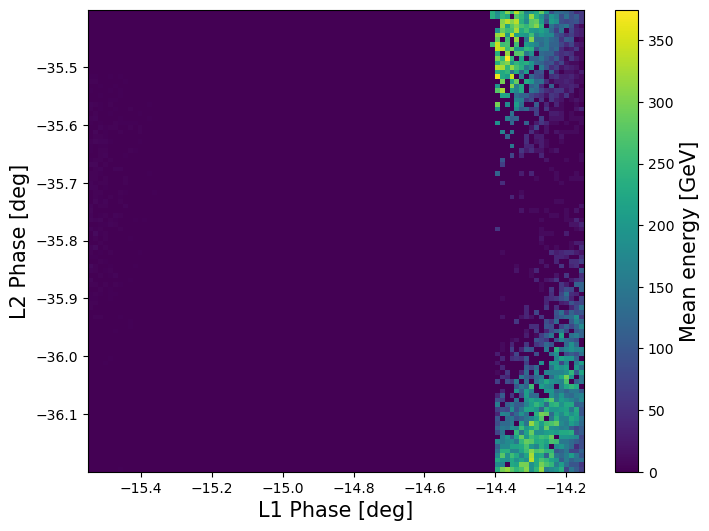

In [932]:
plt.figure(figsize=(8, 6))
plt.pcolormesh(x_edges, y_edges, counts_normalized.T, cmap='viridis', shading='auto')
plt.xlabel(jitter_labels[x_key], fontsize=15)
plt.ylabel(jitter_labels[y_key], fontsize=15)
cb = plt.colorbar()
cb.set_label(label=key_label_dict[diagnostic_key], size=15)
plt.show()

### 1D summary plots

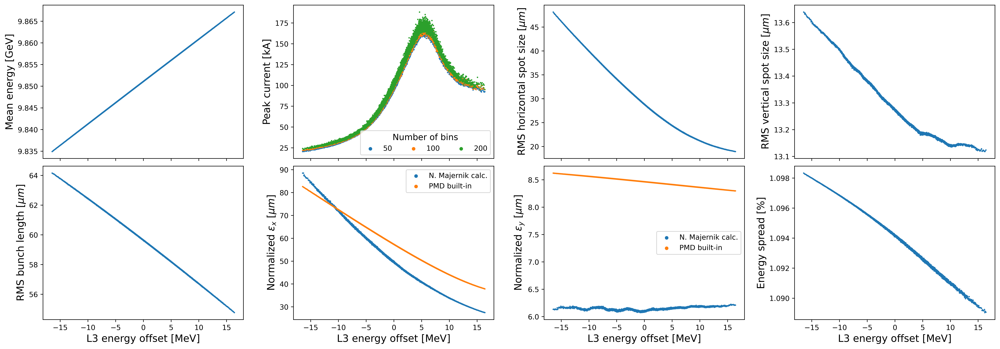

In [31]:
full_summary_scatter_plots(L_str=L_str, jitter_param='amplitude', location='PENT', show=True, return_ax=False, ncols=3)
# summary_scatter_plots(L_str=L_str, jitter_param='amplitude', location='PENT', show=True, return_ax=False)

# for L0B phase jitter, set every other x-tick label so no overlaps
# ax = full_summary_scatter_plots(L_str=L_str, jitter_param='phase', location='PENT', show=False, return_ax=True)
# for i in range(4):
#     for label in ax[1,i].xaxis.get_ticklabels()[::2]:
#         label.set_visible(False)
# plt.show()

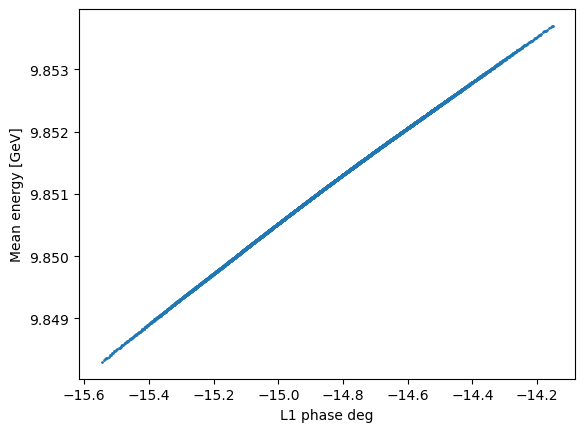

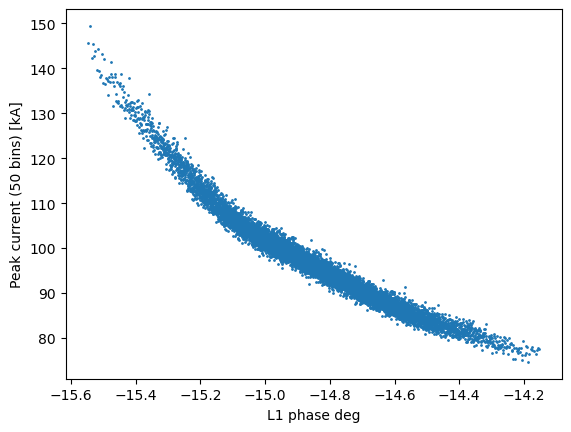

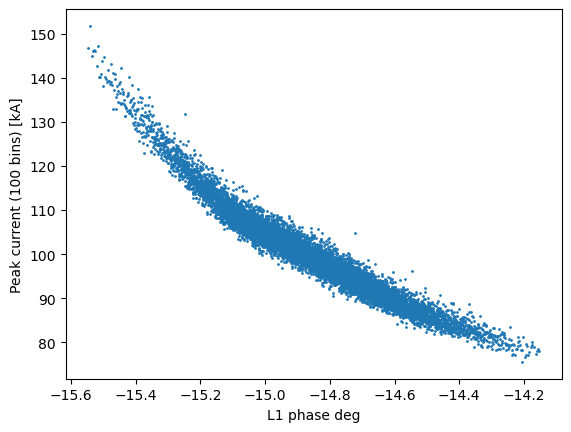

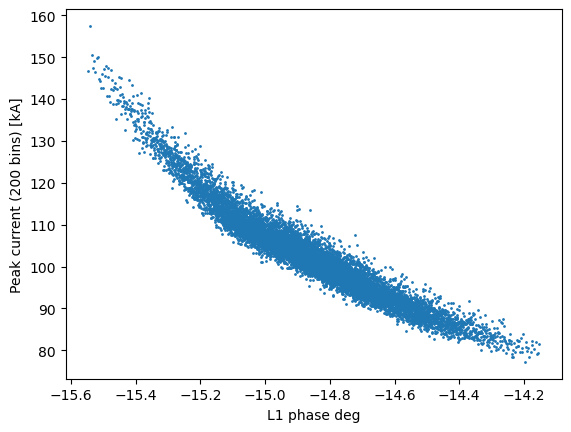

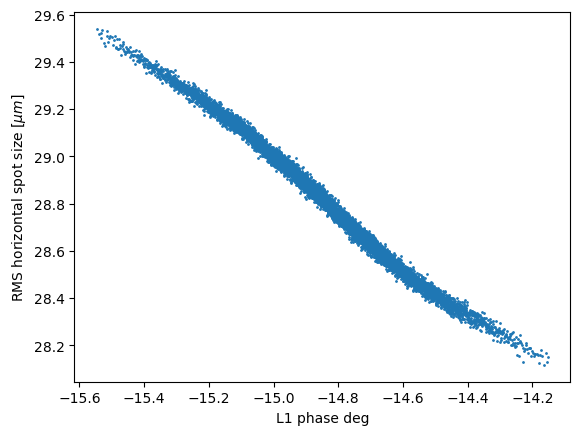

...

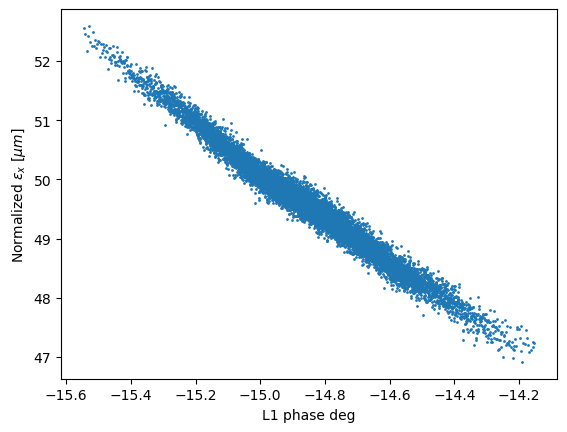

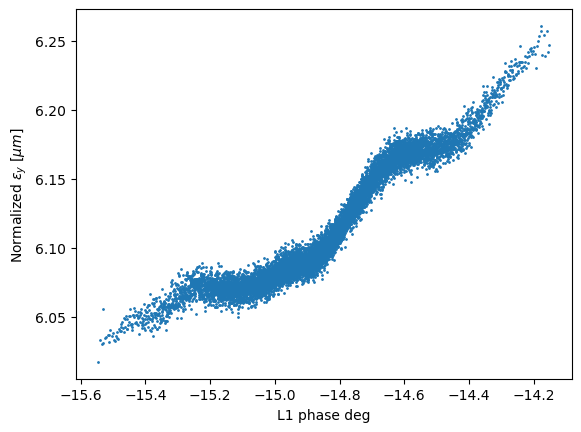

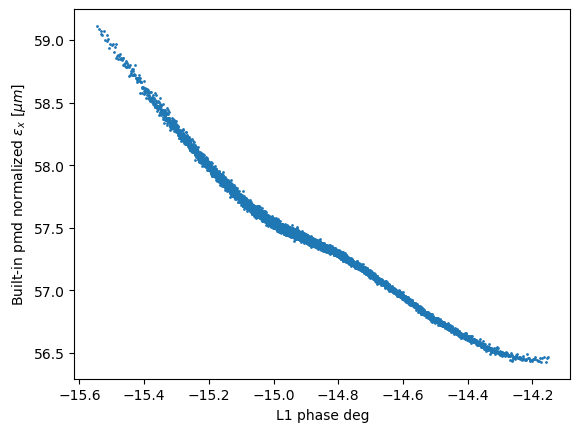

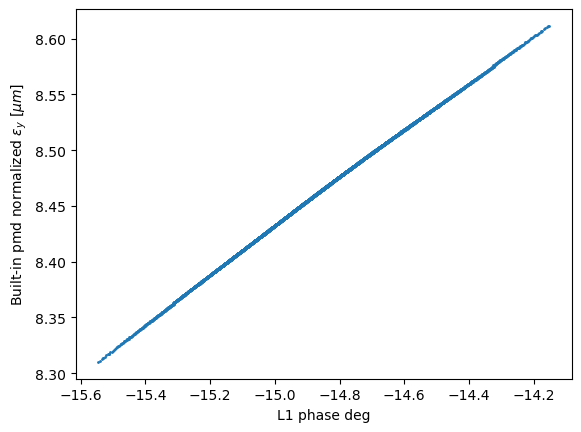

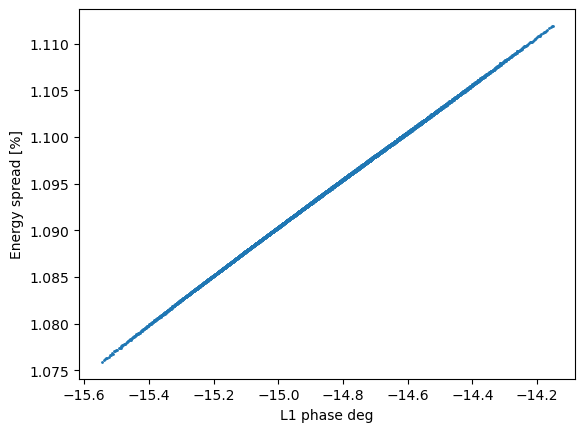

In [8]:
location = 'PENT'

for key in key_label_dict.keys():
    plt.scatter(xopt_out['L1PhaseSet'],
                gather_diagnostics(location, key, xopt_out),
                s=1
               )
    plt.xlabel('L1 phase deg')
    plt.ylabel(key_label_dict[key])
    
    plt.show()

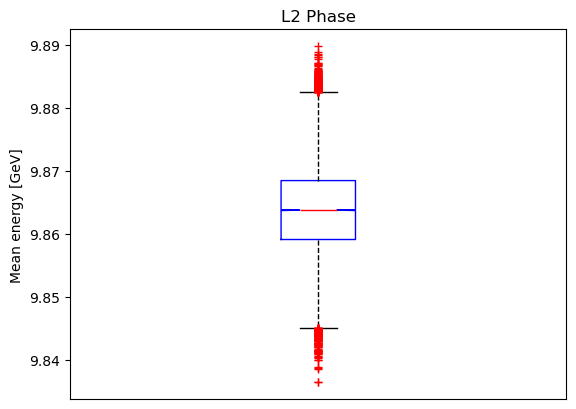

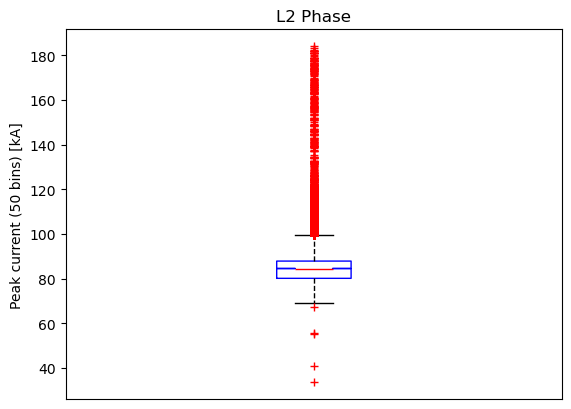

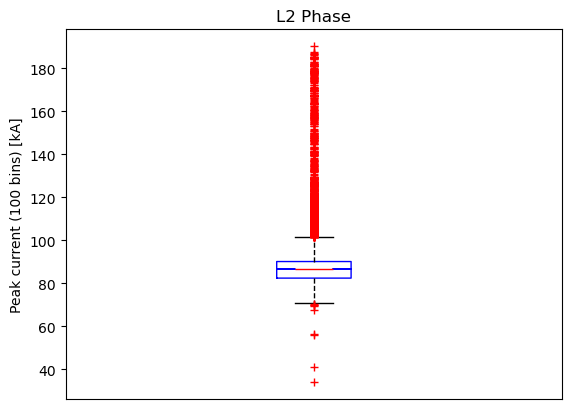

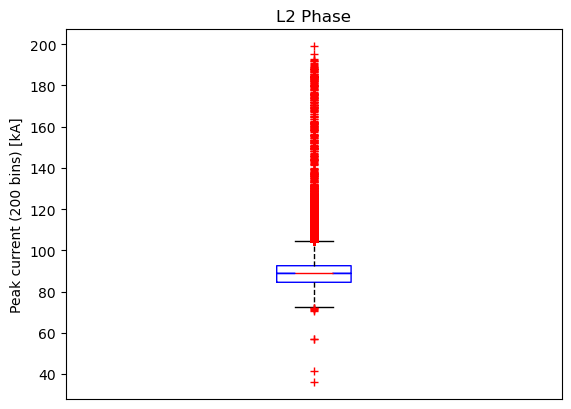

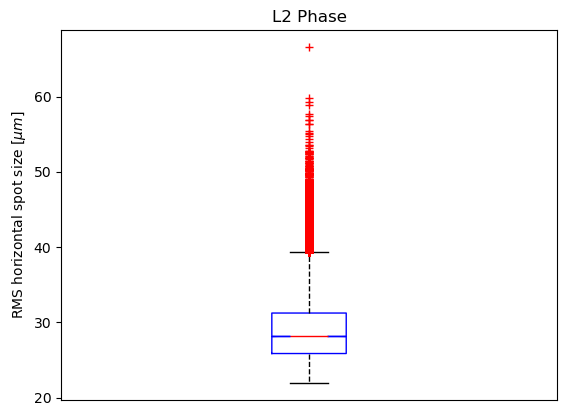

...

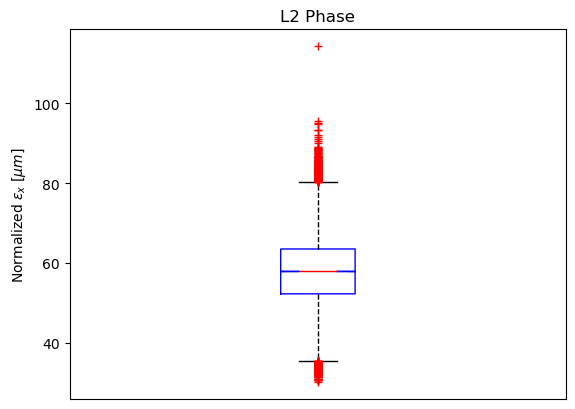

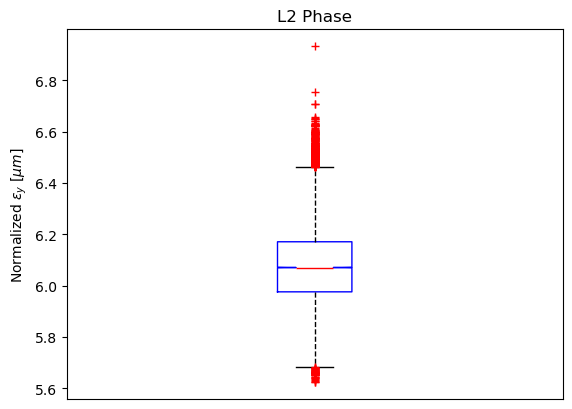

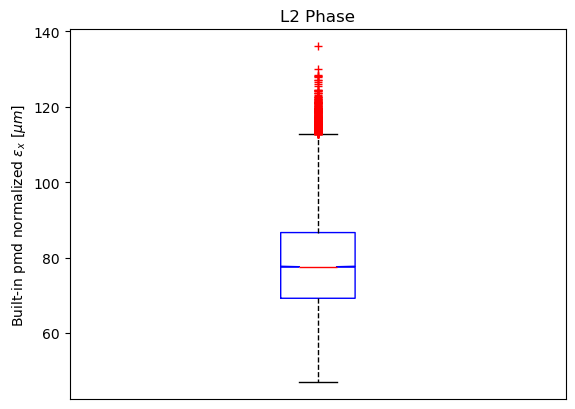

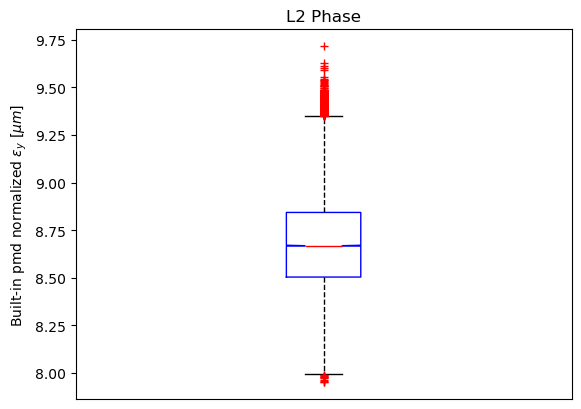

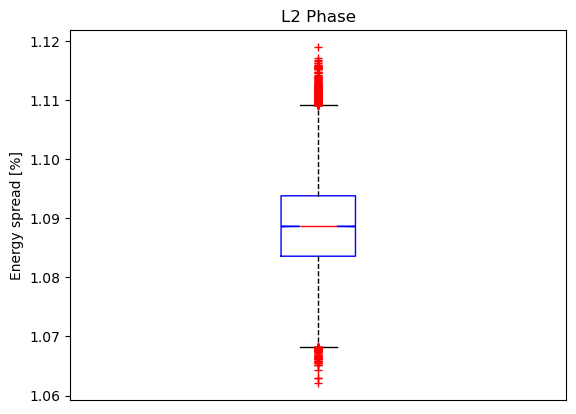

In [15]:
location = 'PENT'

for key in key_label_dict.keys():
    TDRBoxPlot(
        # key,
        gather_diagnostics(location)
    )
    # plt.xlabel(jitter_file_str)
    plt.ylabel(key_label_dict[key])
    plt.xticks([])
    plt.title('L2 Phase')
    plt.show()

# Statistical convergence

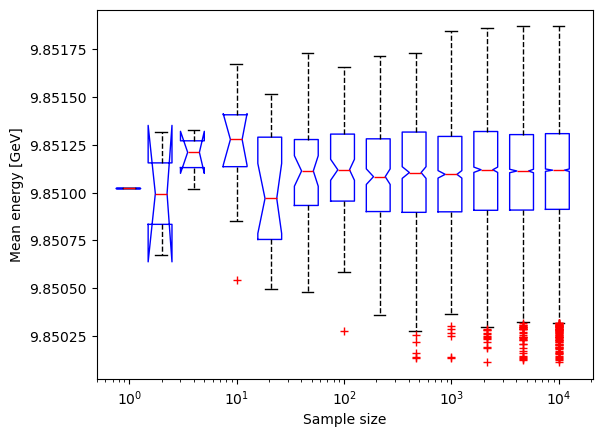

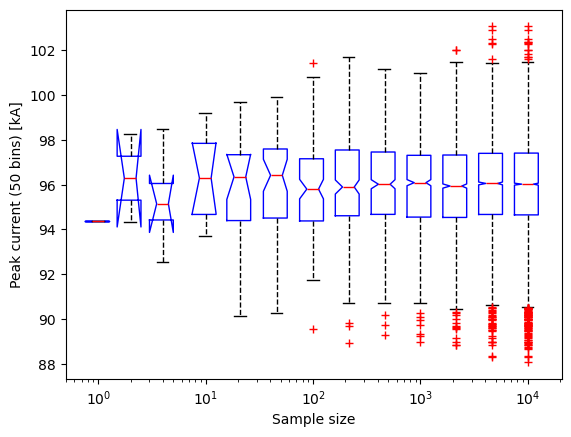

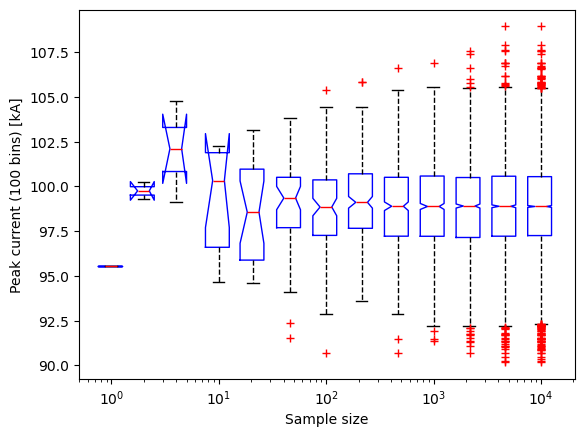

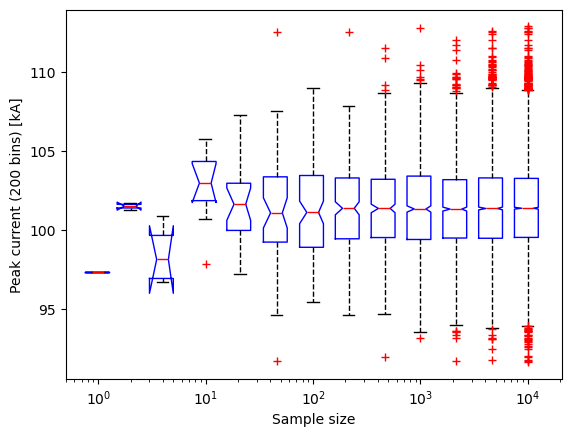

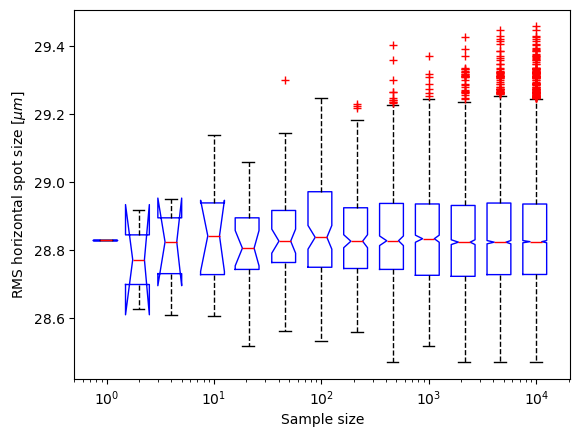

...

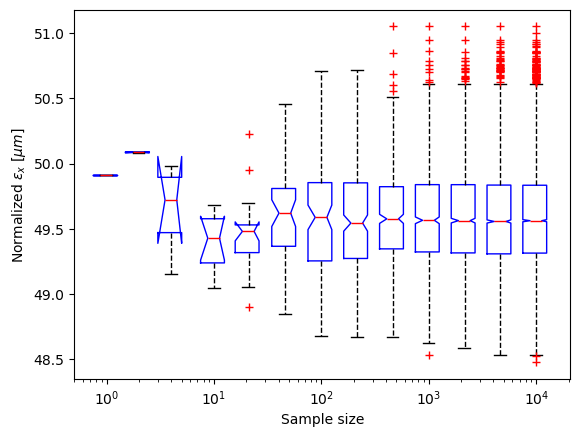

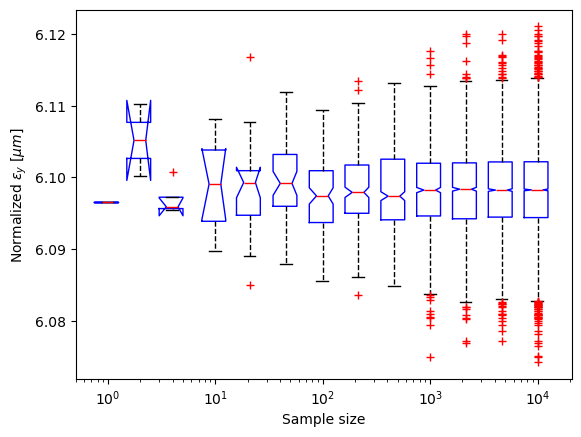

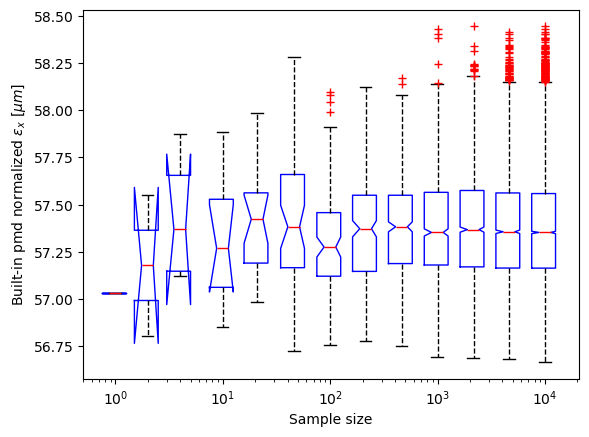

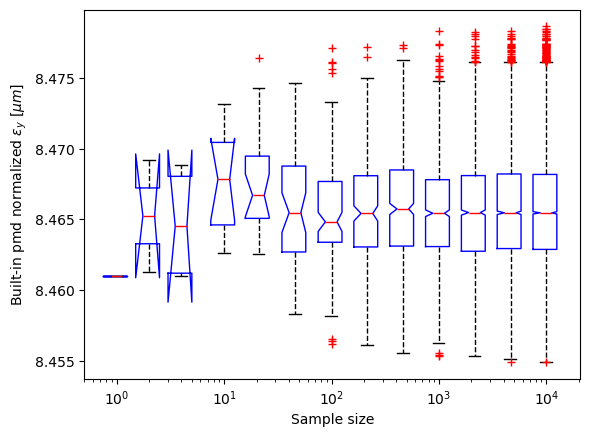

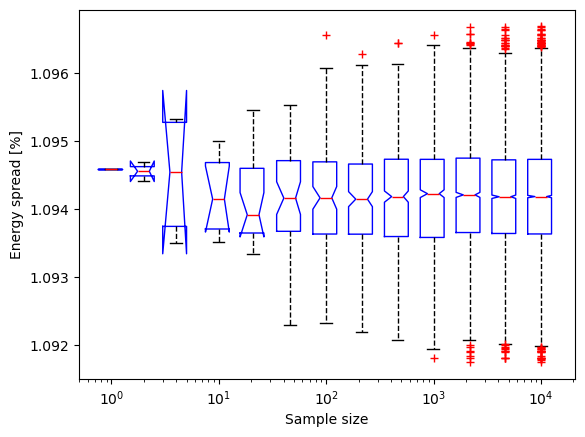

In [81]:
for key in key_label_dict.keys():
    stat_convergence(diagnostics, key, plot=True, return_data=False)

# Eval point and peak current visualizations

### Test evaluation points for 10x run

In [135]:
eval_pts = pd.read_csv(f'/pscratch/sd/m/maxvarv/Jitter_2025_02_25/10x_L2_Phase/evaluation_points.csv')

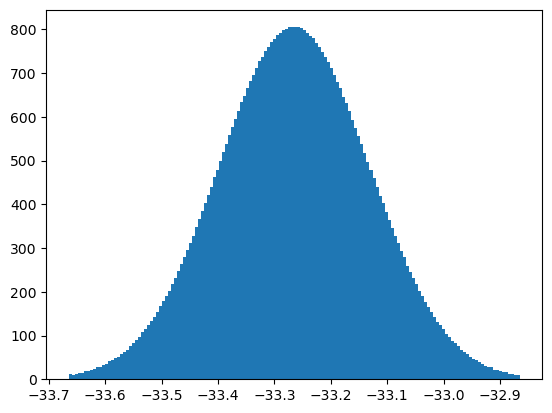

In [146]:
plt.hist(eval_pts, bins=150)
plt.show()

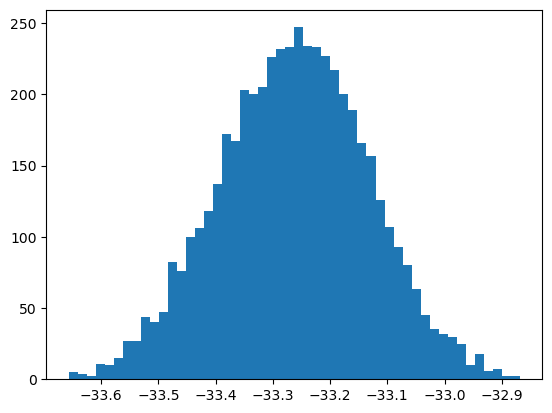

In [164]:
i=9
num_tasks = 140*36
plt.hist(eval_pts[i*num_tasks:(i+1)*num_tasks], bins=50)
plt.show()

### Peak current bin test

In [38]:
uid = xopt_out['Unique ID'].iloc[0]
loc = 'PENT'
P   = pmd_beamphysics.ParticleGroup(f'{directory}/{uid}/{loc}.h5')

In [64]:
bins = [(i+1) for i in range(10)] \
    + [(i+1)*5 for i in range(10)] \
    + [(i+1)*10 for i in range(10)] \
    + [(i+1)*50 for i in range(10)] \
    + [(i+1)*100 for i in range(10)] \
    + [(i+1)*500 for i in range(10)] \
    + [(i+1)*1000 for i in range(10)]

# peak_current = np.zeros(len(bins))
peak_current = {}
for i in range(len(bins)):
    peak_current[bins[i]] = P.slice_statistics(slice_key='t', n_slice=bins[i])['current'].max() * 1e-3

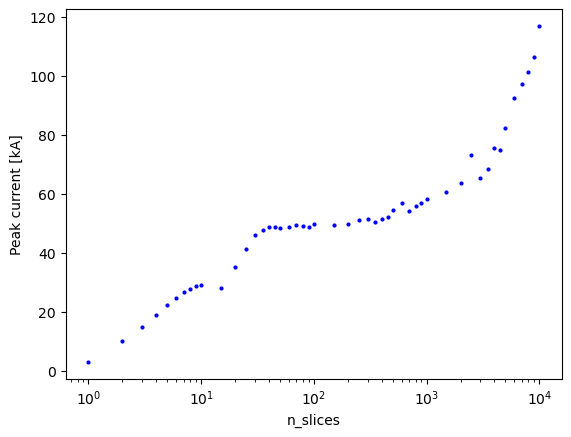

In [65]:
plt.scatter(peak_current.keys(), peak_current.values(), s=4, color='b')
plt.xscale('log')
plt.xlabel('n_slices')
plt.ylabel('Peak current [kA]')
plt.show()

# Look for slices of 1D jitter

In [5]:
# from synthetic dist
cutoff_sigma = 3

importedDefaultSettings = loadConfig(f'setLattice_configs/2025-02-25_oneBunch_baseline.yml')

# nominal bmad params
nominal_L0B_Phase = importedDefaultSettings['L0BPhaseSet']
nominal_L0BF_Amp  = 5.95e7
nominal_L1_Phase  = importedDefaultSettings['L1PhaseSet']
nominal_L1_Amp    = 0.335e9 - 0.125e9
nominal_L2_Phase  = importedDefaultSettings['L2PhaseSet']
nominal_L2_Amp    = 4.5e9 - 0.335e9
nominal_L3_Phase  = importedDefaultSettings['L3PhaseSet']
nominal_L3_Amp    = 10.0e9 - 4.5e9

# values obtained from `2024 run` column of https://docs.google.com/spreadsheets/d/1xeCUImz5uFSq6QA3wV91dG38s-8cyVXQMGw9hjPKa6M/edit?usp=sharing
charge_jitter_percent  = 2.3
gun_Phase_jitter       = 0.15
gun_Amp_jitter_percent = 0.25
L0A_Phase_jitter       = 0.1 # degS
L0A_Amp_jitter_percent = 0.06
L0B_Phase_jitter       = 0.1 # degS
L0B_Amp_jitter_percent = 0.5
L1A_Phase_jitter       = 0.7 # degS
L1A_Amp_jitter_percent = 0.6
L1B_Phase_jitter       = 0.5 # degS
L1B_Amp_jitter_percent = 0.7
L2_Phase_jitter        = 0.4 # degS
L2_Amp_jitter_percent  = 0.3
L3_Phase_jitter        = 0.4 # degS
L3_Amp_jitter_percent  = 0.3

nominal_values = {
    'L0BPhaseSet'    : nominal_L0B_Phase,
    'L1PhaseSet'     : nominal_L1_Phase,
    'L2PhaseSet'     : nominal_L2_Phase,
    'L3PhaseSet'     : nominal_L3_Phase,
    'L0BEnergyOffset': nominal_L0BF_Amp,
    'L1EnergyOffset' : nominal_L1_Amp,
    'L2EnergyOffset' : nominal_L2_Amp,
    'L3EnergyOffset' : nominal_L3_Amp,
}

### Check filtering correctly

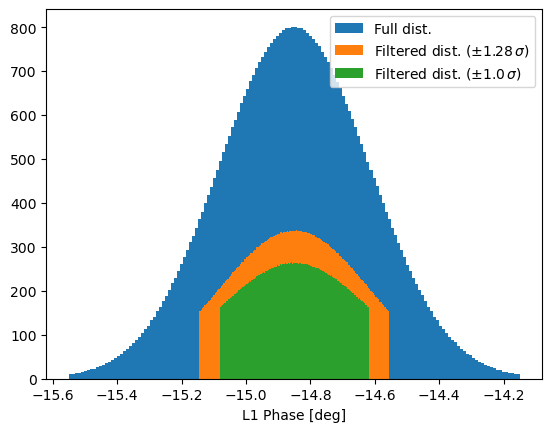

In [6]:
n_sigmas_list = [ 1.28, 1.0 ]
bins = 150

jitter_parameter = 'L1PhaseSet'

# minus_sigma = nominal_values[jitter_parameter] - xopt_out[jitter_parameter].std()
# plus_sigma = nominal_values[jitter_parameter] + xopt_out[jitter_parameter].std()

plt.hist(xopt_out[jitter_parameter], label='Full dist.', bins=bins)

for n_sigma in n_sigmas_list:
    minus_sigma = xopt_out[jitter_parameter].mean() - n_sigma * xopt_out[jitter_parameter].std()
    plus_sigma = xopt_out[jitter_parameter].mean() + n_sigma * xopt_out[jitter_parameter].std()

    plt.hist(xopt_out[(xopt_out[jitter_parameter] > minus_sigma) & (xopt_out[jitter_parameter] < plus_sigma)][jitter_parameter], label=f'Filtered dist. ($\\pm{n_sigma}\\,\\sigma$)', bins=bins)

plt.legend()
plt.xlabel('L1 Phase [deg]')
plt.show()

### Filter out evaluation points with all but one jitter parameter within $\pm\sigma$ of the nominal value

In [200]:
n_sigmas_list = [ 1.28, 1.0 ] # 1.28 # this gives ~ 10k points per slice

# for isolated_parameter in nominal_values.keys():
    
isolated_parameter = 'L2PhaseSet'

oneDim_jitter_dict = {}

for n_sigmas in n_sigmas_list:

    oneDim_jitter = xopt_out
    
    for jitter_parameter in nominal_values.keys():
        if jitter_parameter != isolated_parameter:
            minus_sigma = xopt_out[jitter_parameter].mean() - n_sigmas * xopt_out[jitter_parameter].std()
            plus_sigma  = xopt_out[jitter_parameter].mean() + n_sigmas * xopt_out[jitter_parameter].std()
            
            oneDim_jitter = oneDim_jitter[(oneDim_jitter[jitter_parameter] > minus_sigma) & (oneDim_jitter[jitter_parameter] < plus_sigma)]
    
    oneDim_jitter_dict[n_sigmas] = oneDim_jitter
    
    print(oneDim_jitter[isolated_parameter].size)

10085
3271


### Scatter plots

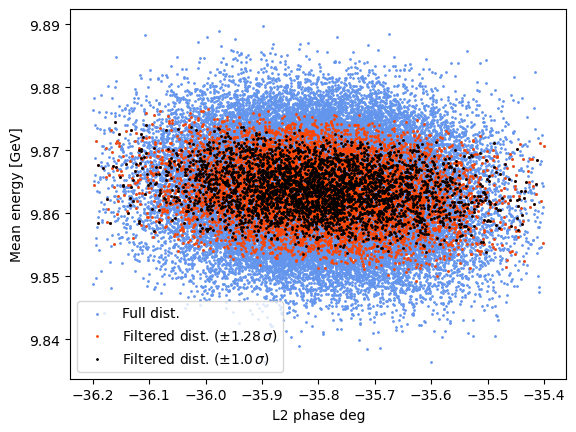

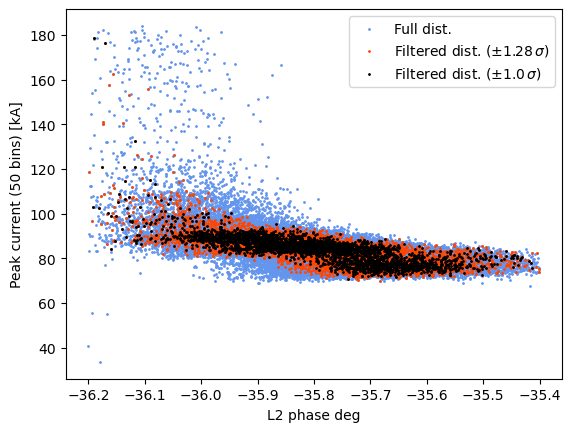

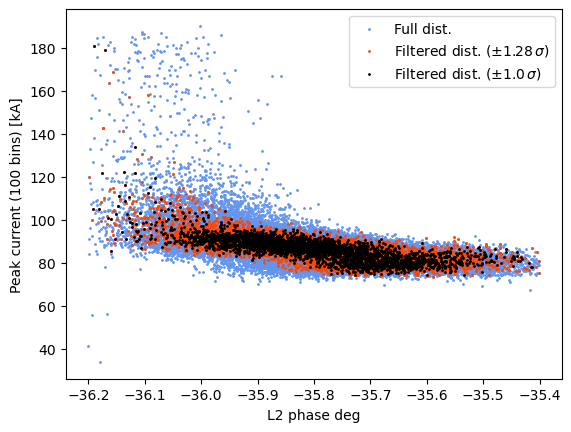

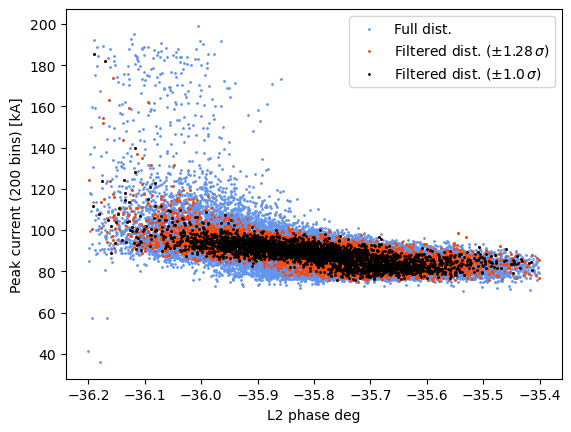

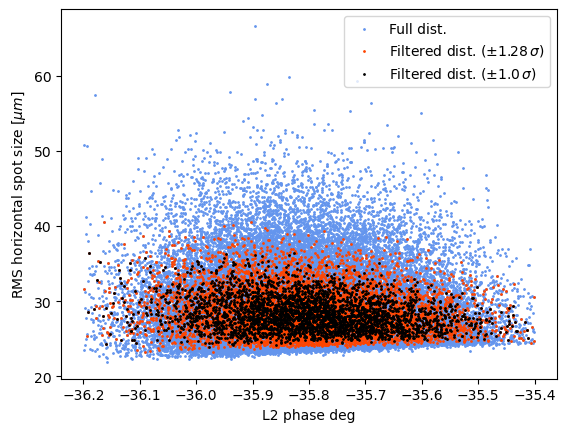

...

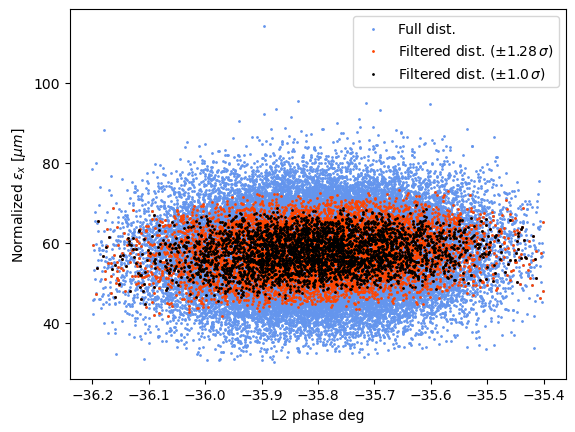

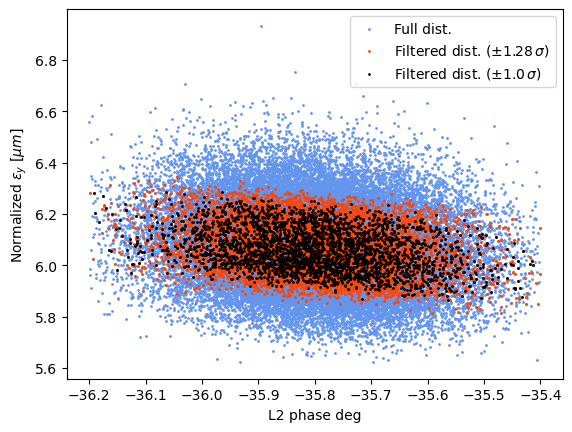

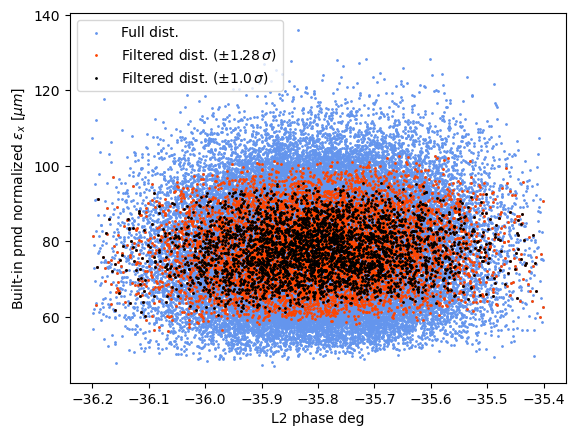

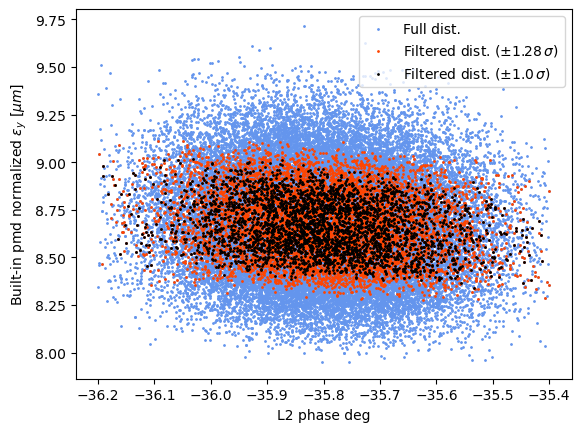

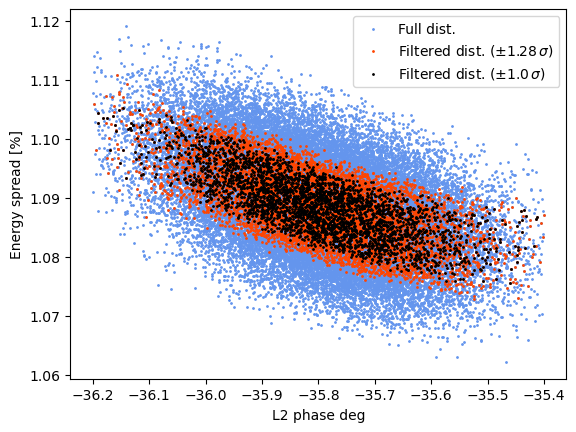

In [212]:
location = 'PENT'

# colors = ['tab:orange', 'k']
colors = ['orangered', 'k']

for key in key_label_dict.keys():
    plt.scatter(xopt_out['L2PhaseSet'],
                gather_diagnostics(location, key, dataFrame=xopt_out),
                s=1,
                label='Full dist.',
                c='cornflowerblue'
               )
    
    for idx,n_sigmas in enumerate(oneDim_jitter_dict.keys()):
        plt.scatter(oneDim_jitter_dict[n_sigmas]['L2PhaseSet'],
                    gather_diagnostics(location, key, dataFrame=oneDim_jitter_dict[n_sigmas]),
                    s=1,
                    label=f'Filtered dist. ($\\pm{n_sigmas}\\,\\sigma$)',
                    c=colors[idx]
                   )
    
    plt.xlabel('L2 phase deg')
    plt.ylabel(key_label_dict[key])
    
    if key == 'peak current':
        plt.yscale('log')

    plt.legend()
    plt.show()

### Convergence

In [191]:
oneDim_jitter_diagnostics = { uid: diagnostics[uid] for uid in oneDim_jitter['Unique ID'] }

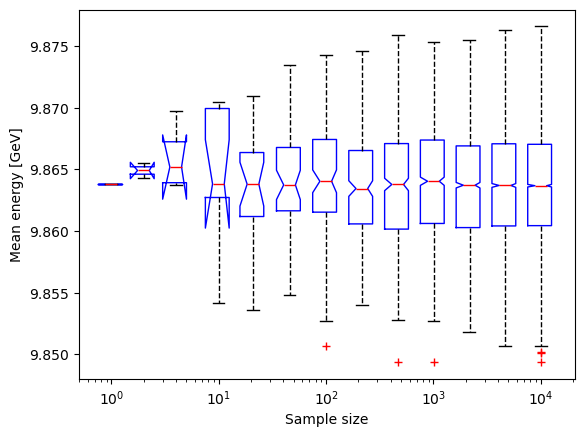

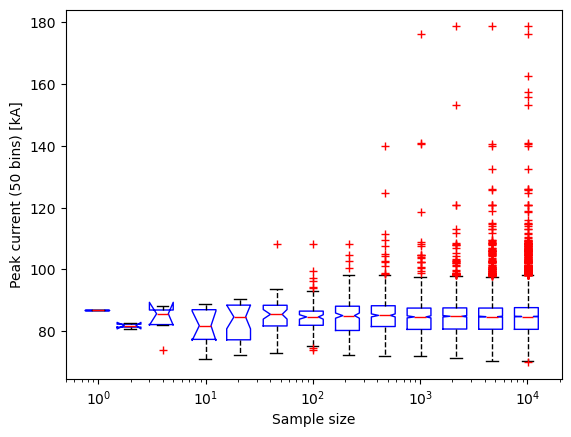

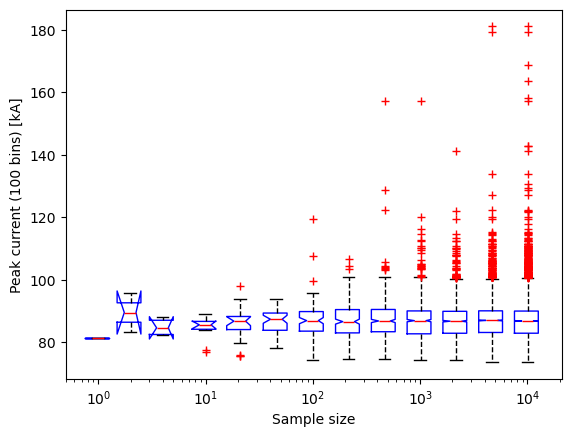

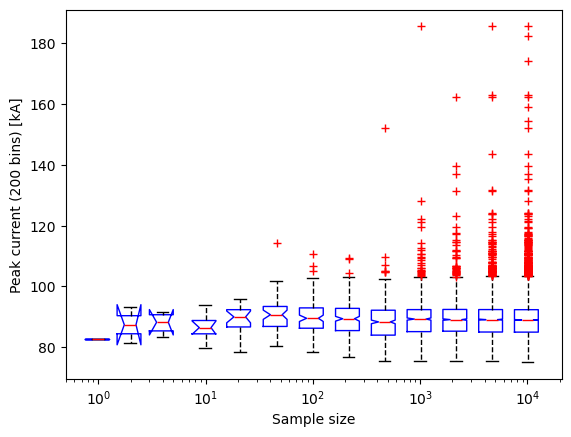

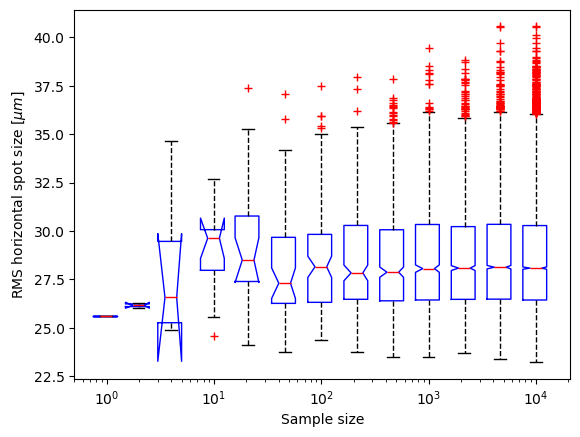

...

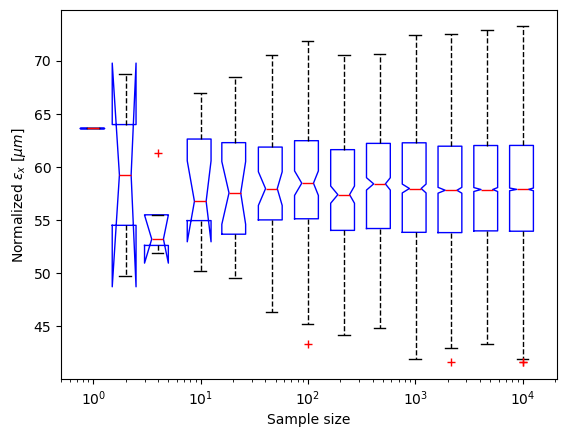

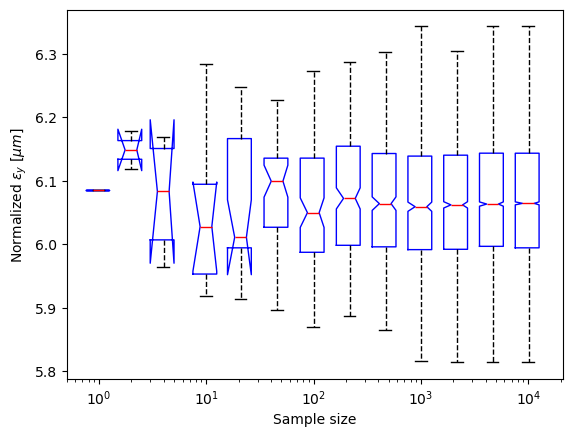

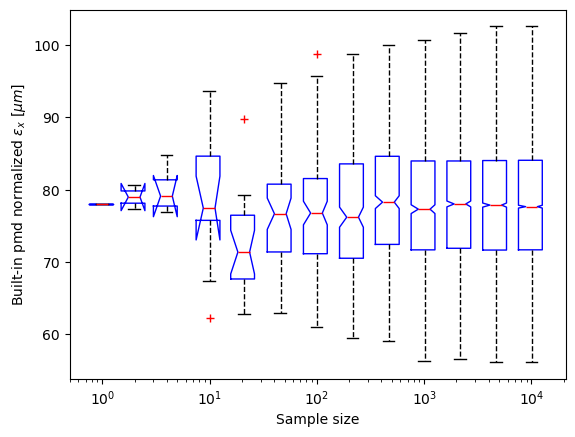

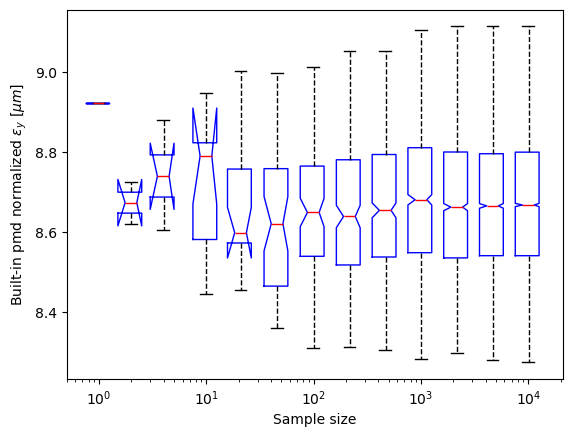

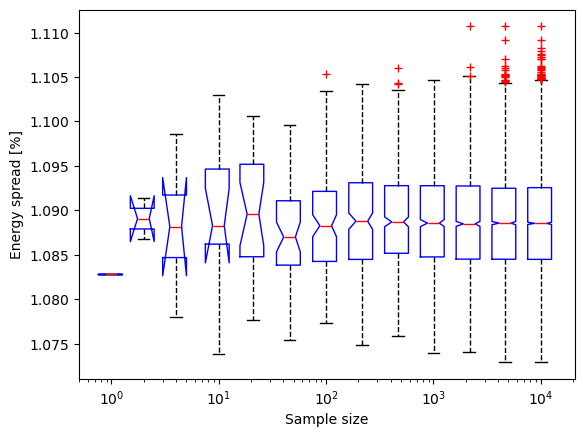

In [192]:
for key in key_label_dict.keys():
    stat_convergence(oneDim_jitter_diagnostics, key, plot=True, return_data=False)

# Plots from a random sample of simulations

In [500]:
sample_size = 500
sample_uids = random.sample(list(diagnostics.keys()), k=sample_size)

In [831]:
# alternate implementation

location = 'PENT'
output_path = f'/pscratch/sd/m/maxvarv/Linac_phase_amp_jitter_2025_03_17'
n_slice_2 = 600 # 808
plot_array_2 = np.zeros((sample_size, n_slice_2))
delta_t_array_2 = np.zeros_like(plot_array_2)
tmin = -0.2
tmax=0.2 # 0.01

for idx,uid in enumerate(sample_uids):
    P = pmd_beamphysics.ParticleGroup(f"{output_path}/{uid}/{location}.h5")
    # plot_array[idx] = 1e-3 * P.slice_statistics(slice_key='t', n_slice=n_slice)['current']
    # delta_t_array[idx] = 1e12*(P.slice_statistics(slice_key='t', n_slice=n_slice)['mean_t'] - P.avg('t'))
    # H,edges = P.histogramdd('delta_t', bins=n_slice_2)
    
    # do it this way so that the t-axis is aligned for all the histograms!
    H,edges = np.histogramdd(P.delta('t'), bins=n_slice_2, range=[[tmin*1e-12, tmax*1e-12]])
    edges=edges[0]
    delta_t_array_2[idx] = 1e12 * (edges[:-1] + edges[1:]) / 2
    # scale to correct peak current calculation
    plot_array_2[idx] = H / max(H) * 1e-3 * P.slice_statistics(slice_key='t', n_slice=n_slice)['current'].max()
    

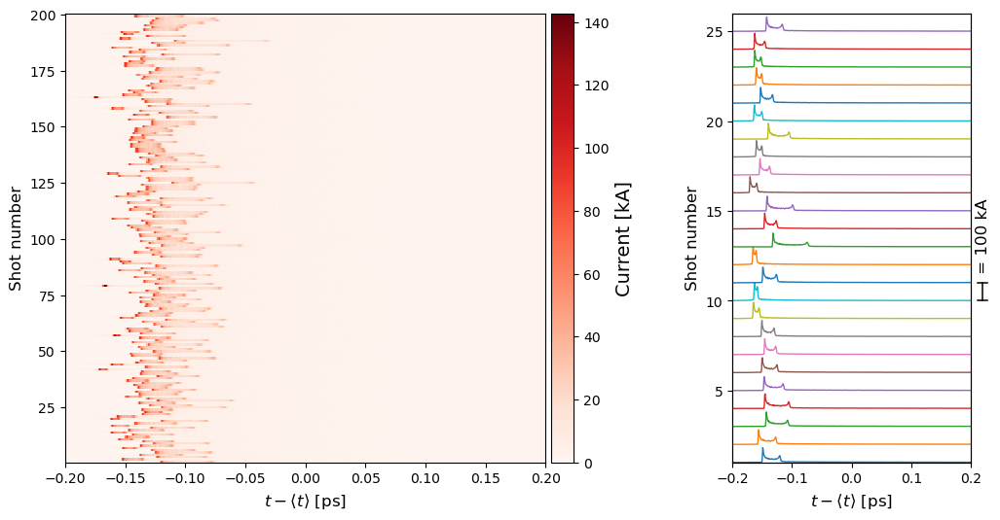

In [832]:
# alternate implementation

forced_max_idx = stats.mode(np.argmin(abs(delta_t_array_2 - 0.1), axis=1)).mode + 1
shot_count = 200

cmap = 'Reds'

fig = plt.figure(figsize=(12, 6))

ax1 = plt.subplot(1,3,(1,2))

img = ax1.imshow(plot_array_2[:shot_count,:forced_max_idx], cmap=cmap, interpolation='none', aspect='auto', extent=[tmin, tmax, 0.5, shot_count+0.5], vmin=0)
cb = plt.colorbar(img, ax=ax1, pad=0.01)
cb.set_label('Current [kA]', fontsize=14)

ax1.set_xlabel(r'$t - \langle t \rangle\ [\mathrm{ps}]$', fontsize=12)
ax1.set_ylabel('Shot number', fontsize=12)

ax2 = plt.subplot(1,3,3)

for idx in range(25):
    # ax2.plot(delta_t_array_2[idx], 8.5e-3 * plot_array_2[idx] + idx + 1, lw=1)
    ax2.plot(delta_t_array_2[idx], 1e-2 * (plot_array_2[idx] + 100 * (idx + 1)), lw=1)
ax2.set_xlim(left=tmin, right=tmax)
ax2.set_ylim(bottom=1, top=26)
ax2.set_xlabel(r'$t - \langle t \rangle\ [\mathrm{ps}]$', fontsize=12)
ax2.set_ylabel('Shot number', fontsize=12)
ax3 = plt.twinx()
ax3.axvline(x=0.22, ymin=0.36, ymax=0.4, color='k', lw=1.1, ls='-', clip_on=False)
ax3.axhline(y=0.36, xmin=1.03, xmax=1.07, color='k', lw=1.1, ls='-', clip_on=False)
ax3.axhline(y=0.4, xmin=1.03, xmax=1.07, color='k', lw=1.1, ls='-', clip_on=False)
ax3.set_ylabel(' = 100 kA', fontsize=12)
ax3.set_yticks([])

plt.subplots_adjust(wspace=0.4)

plt.show()

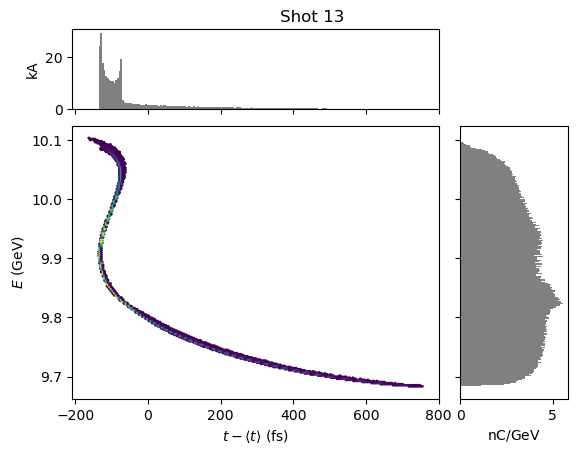

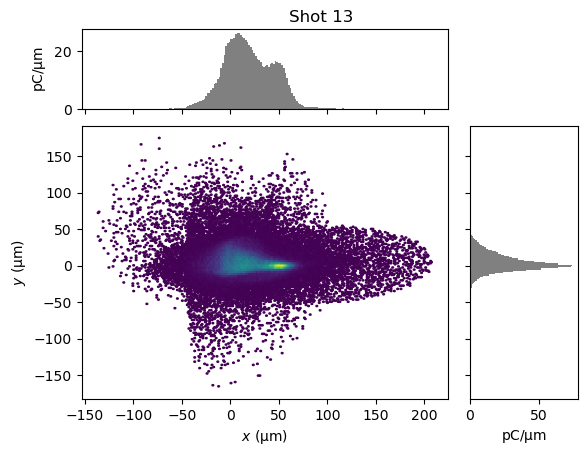

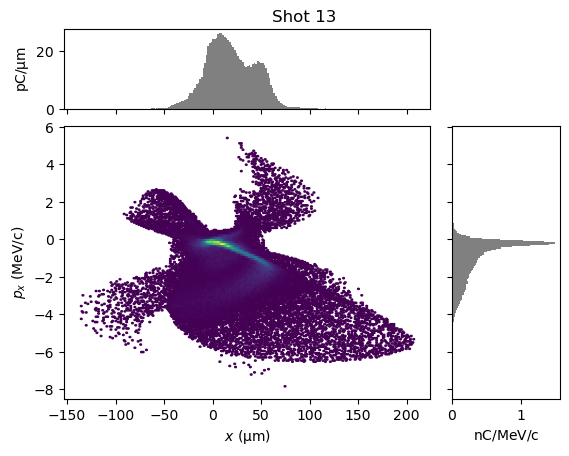

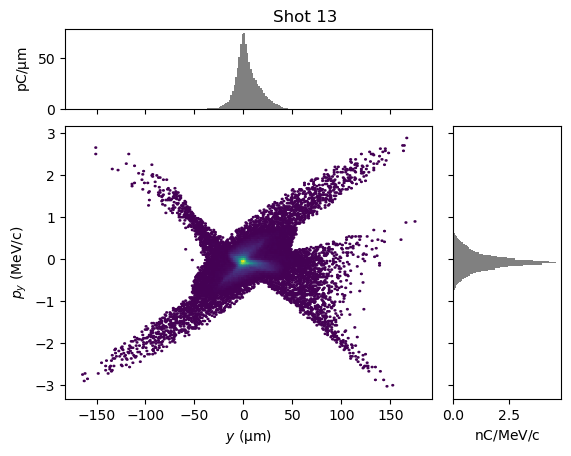

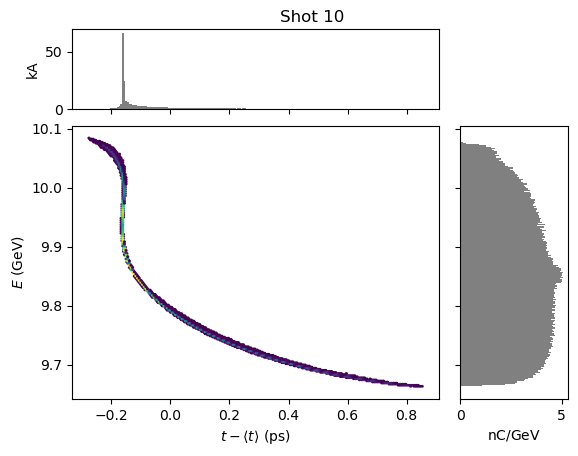

...

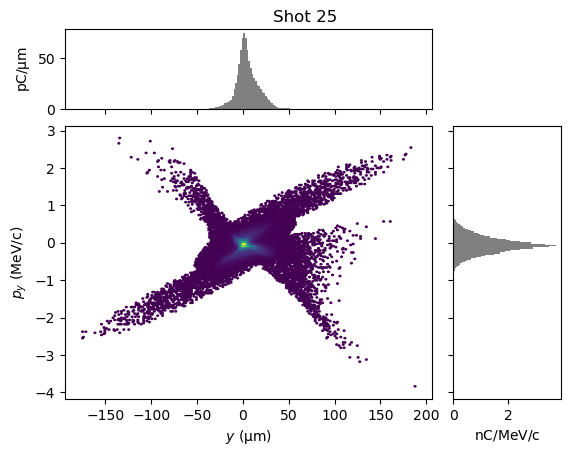

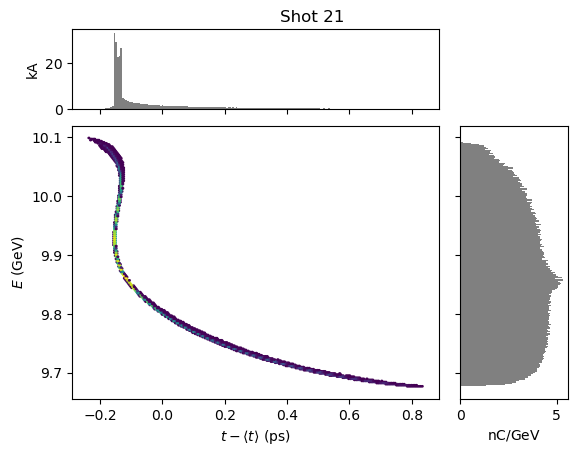

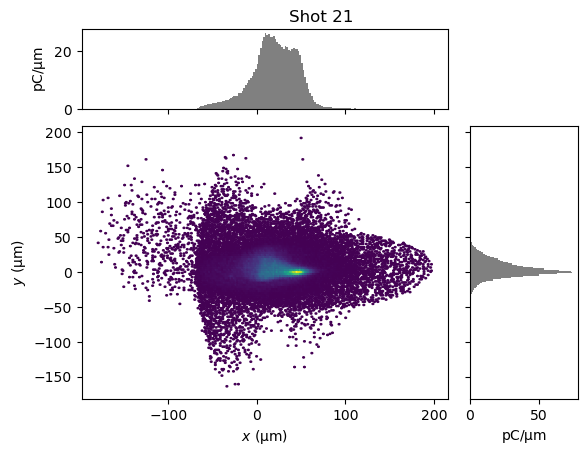

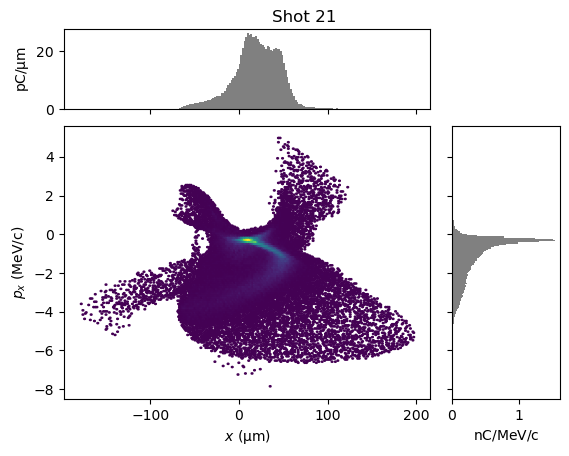

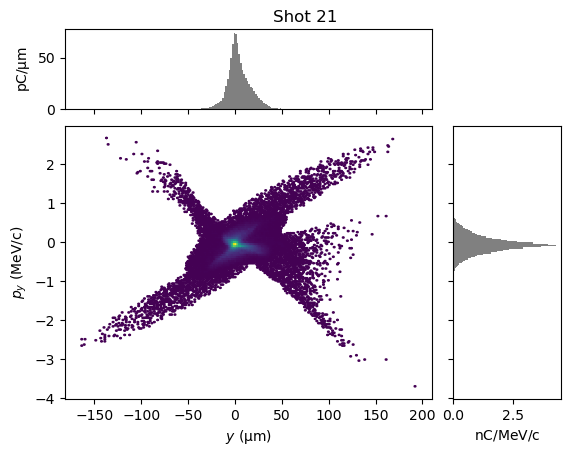

In [840]:
# randomly select from smaller pool to view phase spaces
location='PENT'

for idx in random.sample([i for i in range(25)], k=4):
    P = pmd_beamphysics.ParticleGroup(f"{output_path}/{sample_uids[idx]}/{location}.h5")

    fig = P.plot('delta_t', 'energy', return_figure=True)
    fig.suptitle(f'Shot {idx+1}', y=.92)
    
    fig = P.plot('x', 'y', return_figure=True)
    fig.suptitle(f'Shot {idx+1}', y=.92)
    
    fig = P.plot('x', 'px', return_figure=True)
    fig.suptitle(f'Shot {idx+1}', y=.92)
    
    fig = P.plot('y', 'py', return_figure=True)
    fig.suptitle(f'Shot {idx+1}', y=.92)

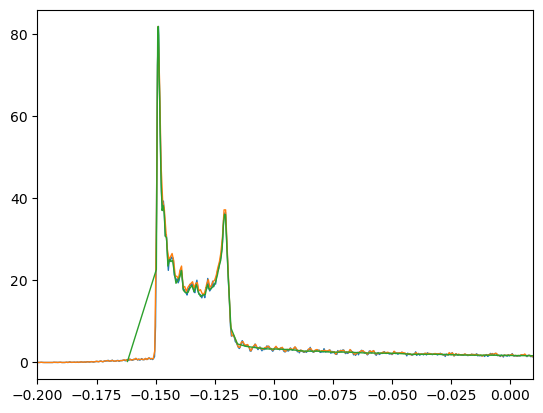

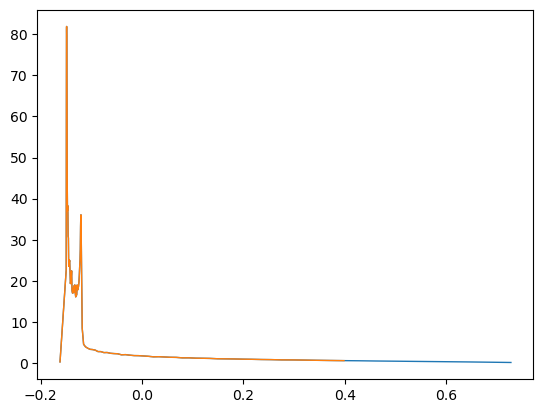

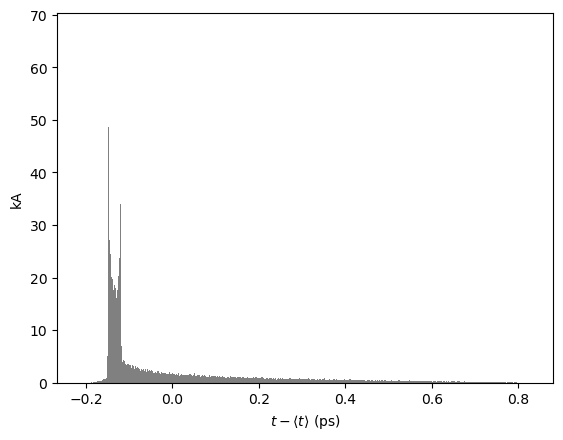

In [830]:
# compare different current profile methods

P = pmd_beamphysics.ParticleGroup(f"{output_path}/{sample_uids[0]}/{location}.h5")
Ip = P.slice_statistics(slice_key='delta_t', n_slice=n_slice)['current'].max() * 1e-3

H,edges = P.histogramdd('delta_t', bins=2500)
# H2,edges2 = np.histogramdd(P.delta('t'), bins=2500)
H2,edges2 = np.histogramdd(P.delta('t'), bins=600, range=[[-0.2*1e-12, 0.2*1e-12]])
edges=edges[0]
edges2=edges2[0]
# plt.stairs(H, edges=edges)
plt.plot(1e12 * (edges[:-1] + edges[1:]) / 2, H / max(H) * Ip, lw=1)
plt.plot(1e12 * (edges2[:-1] + edges2[1:]) / 2, H2 / max(H2) * Ip, lw=1)
plt.plot(1e12*(P.slice_statistics(slice_key='t', n_slice=n_slice)['mean_t'] - P.avg('t')), 1e-3 * P.slice_statistics(slice_key='delta_t', n_slice=n_slice)['current'], lw=1)
# plt.plot((edges[:-1] + edges[1:]) / 2, 1e-12 * 1e6 * plot_array[-1])
plt.xlim(left=-0.2, right=0.01)
plt.show()

plt.plot(1e12*(P.slice_statistics(slice_key='t', n_slice=n_slice)['mean_t'] - P.avg('t')), 1e-3 * P.slice_statistics(slice_key='delta_t', n_slice=n_slice)['current'], lw=1)
plt.plot(1e12*(P.slice_statistics(slice_key='t', n_slice=n_slice)['mean_t'][:93] - P.avg('t')), 1e-3 * P.slice_statistics(slice_key='delta_t', n_slice=n_slice)['current'][:93], lw=1)
# plt.xticks([-0.2,0.0,0.2,0.4,0.6,0.8])
plt.show()

P.plot('delta_t', bins=800)
# plt.xlim(-0.2,0.8)

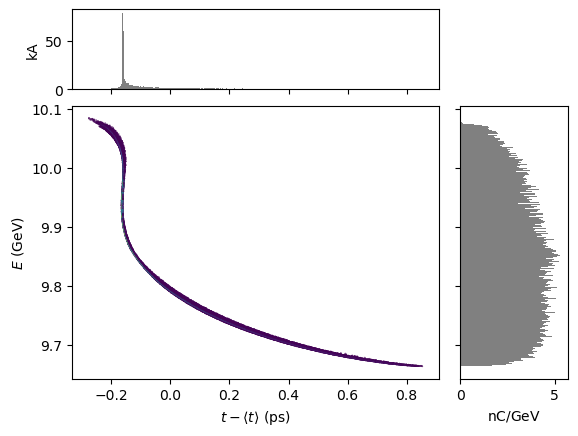

In [519]:
P = pmd_beamphysics.ParticleGroup(f"{output_path}/{sample_uids[9]}/{location}.h5")
P.plot('delta_t','energy', bins=800)

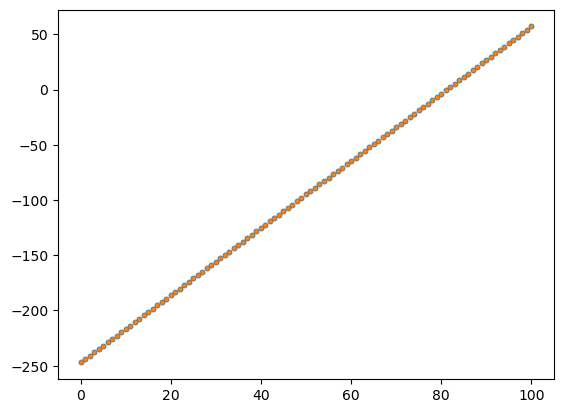

In [139]:
# check z binning

plt.scatter([i for i in range(n_slice+1)], 1e6 * (P.histogramdd('z', bins=n_slice)[1] - P.avg('z')), s=10)
plt.scatter([i for i in range(n_slice+1)], np.histogram(1e6*(P.z - P.avg('z')), bins=n_slice)[1], s=5)
plt.show()

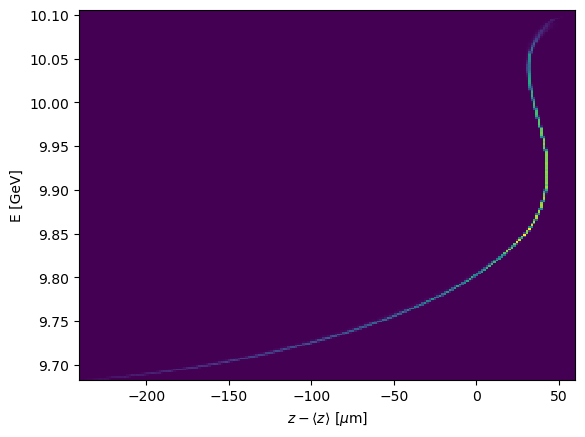

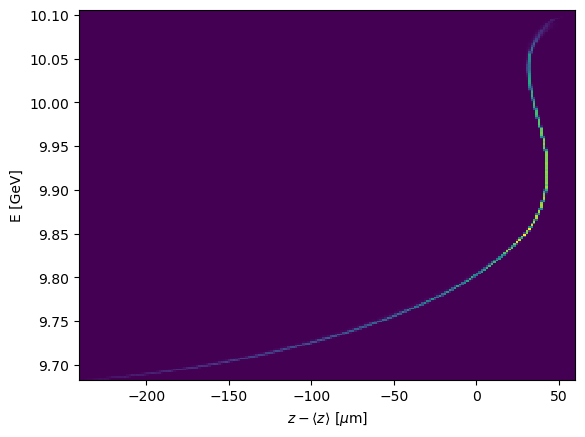

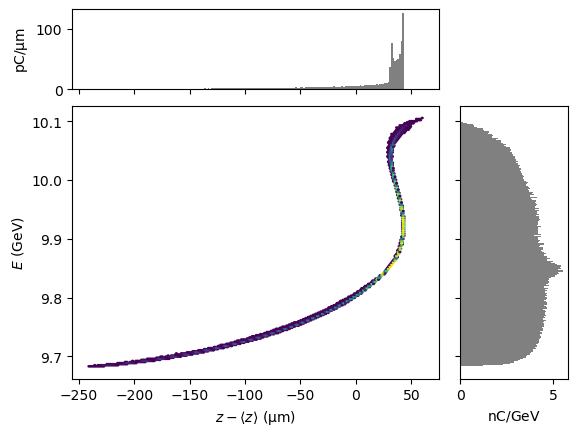

In [190]:
# check z - <z> is correct

plt.hist2d(1e6*(P.z - P.avg('z')), P.energy*1e-9, bins=200)
plt.xlabel(r'$z-\langle z \rangle\ [\mu \mathrm{m}]$')
plt.ylabel('E [GeV]')
plt.show()

plt.hist2d(1e6*P.delta('z'), P.energy*1e-9, bins=200)
plt.xlabel(r'$z-\langle z \rangle\ [\mu \mathrm{m}]$')
plt.ylabel('E [GeV]')
plt.show()

P.plot('delta_z', 'energy')

### incorrect implementation

In [501]:
location = 'PENT'
output_path = f'/pscratch/sd/m/maxvarv/Linac_phase_amp_jitter_2025_03_17'
n_slice = 100

plot_array = np.zeros((sample_size, n_slice))
delta_t_array = np.zeros_like(plot_array)

for idx,uid in enumerate(sample_uids):
    P = pmd_beamphysics.ParticleGroup(f"{output_path}/{uid}/{location}.h5")
    plot_array[idx] = 1e-3 * P.slice_statistics(slice_key='t', n_slice=n_slice)['current']
    delta_t_array[idx] = 1e12*(P.slice_statistics(slice_key='t', n_slice=n_slice)['mean_t'] - P.avg('t'))

0.11555873352471946 0.16846288336278625


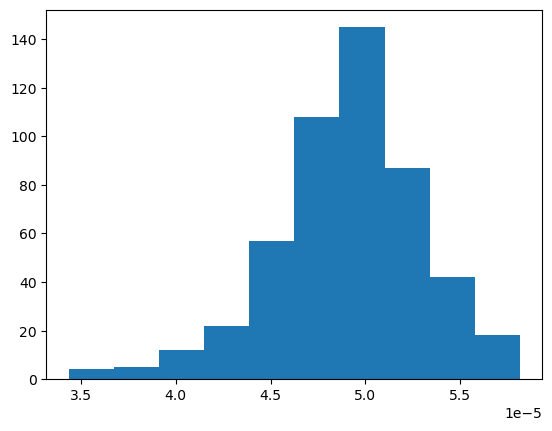

In [578]:
# visualize the horizontal alignment variation with each binning
mins = np.min(delta_t_array, axis=1)
maxs = np.max(delta_t_array, axis=1)
print(max(mins)-min(mins), max(maxs)-min(maxs))
plt.hist(np.mean(delta_t_array, axis=1))
plt.show()

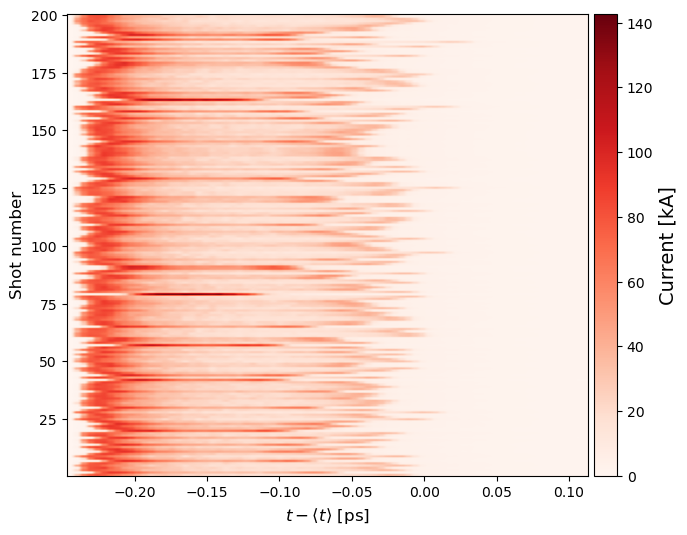

In [507]:
# incorrect alignment!

# plt.hist2d(1e6*(P.z - P.avg('z')), [i for i in range(sample_size)], weights=plot_array.T)
# plt.hist2d(1e6*P.slice_statistics(slice_key='z', n_slice=n_slice)['ptp_z'], [i for i in range(sample_size)], weights=plot_array.T)

forced_max_idx = stats.mode(np.argmin(abs(delta_t_array - 0.1), axis=1)).mode + 1
shot_count = 200

cmap = 'Reds'
plt.figure(figsize=(8, 6))
# img = plt.imshow(plot_array, cmap=cmap, aspect='auto', extent=[global_min, global_max, 0.5, sample_size+0.5])
img = plt.imshow(plot_array[:shot_count,:forced_max_idx], cmap=cmap, aspect='auto', extent=[delta_t_array.min(), delta_t_array[:,forced_max_idx].mean(), 0.5, shot_count+0.5], vmin=0)
cb = plt.colorbar(pad=0.01)
cb.set_label('Current [kA]', fontsize=14)

# plt.xticks(ticks=[i for i in range(n_slice//10)], labels=[f'{num:.2f}' for num in 1e6*(P.histogramdd('z', bins=n_slice)[1] - P.avg('z'))[0][::10] ])

# plt.xlabel(r'$z-\langle z \rangle\ [\mu \mathrm{m}]$', fontsize=12)
plt.xlabel(r'$t - \langle t \rangle\ [\mathrm{ps}]$', fontsize=12)
plt.ylabel('Shot number', fontsize=12)

plt.show()

# **(Old)** Start-to-end with nominal values (convergence scan)

For macro particle vs impact-T resolution, starting heuristic:
$$\textrm{number of macroparticles} = 5 \textrm{ macroparticles per cell} \implies 5 \cdot N_x \cdot N_y \cdot N_z$$

### Define helper functions and presets

In [14]:
compare_energy    = {'ENDINJ': 125e6, 'BC11CEND': 335e6, 'ENDBC14_2': 4.5e9, 'ENDFF20': 1e10}
compare_z         = {'ENDINJ': 557e-6, 'BC11CEND': 339e-6, 'ENDBC14_2': 24e-6, 'ENDFF20': 7.6e-6}
compare_emittance = {'ENDINJ': {'x': 3.6e-6, 'y': 2.7e-6}, 'ENDL3F_2': {'x': 7.1e-6, 'y': 4.6e-6}}
compare_e_spread  = {'ENDINJ': 0.1e-2, 'BC11CEND': 0.5e-2, 'ENDBC14_2': 1e-2, 'ENDFF20': 0.9e-2}

# path_conda = '/global/common/software/m4272/conda/xopt2/bin/'
path_conda = '/global/homes/m/maxvarv/miniforge3/envs/bmad/bin/'

def convergenceScan(output_path: str, Nx: int, scl: int, locations = ['L0AFEND','ENDINJ','BEGL1F','ENDL1F','BC11CEND','ENDL2F','ENDBC14_2','ENDL3F_2','BEGFF20','ENDFF20','PENT'], results = True, **kwargs):
    
    tao = initializeTao(
        inputBeamFilePathSuffix = importedDefaultSettings['inputBeamFilePathSuffix'],
        impactGridCount = Nx,
        csrTF = True,
        numMacroParticles = scl * Nx**3,
        runImpactTF = False,
        GFILESuffix = '2024-10-22_distgen_onebunch.yaml',
        solenoidTValue = -0.41,
        L0APhaseOffset = 0,
        command = path_conda + 'ImpactTexe',    
        command_mpi = path_conda + 'ImpactTexe-mpi',
        mpi_run = '/global/u1/m/maxvarv/miniforge3/envs/bmad/bin/mpirun --map-by :OVERSUBSCRIBE -n {nproc} {command_mpi}',
        # mpi_run = '/global/u1/m/maxvarv/miniforge3/envs/Multifidelity/bin/mpirun --map-by :OVERSUBSCRIBE -n {nproc} {command_mpi}',
        **kwargs
    )
    
    setLattice(tao, **importedDefaultSettings)
    trackBeam(tao, **importedDefaultSettings)
    
    return resultsFromScan(tao, output_path, Nx, scl, locations, True, results)



def resultsFromScan(tao, output_path: str, Nx: int, scl: int, locations: list, write: bool, results: bool = True):
    N = len(locations)

    results = {
                'location'       : locations,
                'energy'         : np.zeros(N),
                'energy spread'  : np.zeros(N),
                'peak current'   : np.zeros(N),
                'sigma_z'        : np.zeros(N),
                'emittance_x'    : np.zeros(N),
                'emittance_y'    : np.zeros(N),
                'pmd_emittance_x': np.zeros(N),
                'pmd_emittance_y': np.zeros(N)
              }
    
    for idx,location in enumerate(locations):
        
        directory = f"{output_path}/{Nx}_{scl}"
        if not os.path.exists(directory):
            os.makedirs(directory)
        
        if write:
            # write to output_path
            pts = getBeamAtElement(tao, location)
            pts.write(f"{directory}/{location}.h5")
        else:
            # read from output_path
            pts = pmd_beamphysics.ParticleGroup(f"{directory}/{location}.h5")
            
        if results:
            results['energy'         ][idx] = pts.avg('energy')
            results['energy spread'  ][idx] = pts.std('energy')/pts.avg('energy')
            results['peak current'   ][idx] = pts.slice_statistics(slice_key='t', n_slice=200)['current'].max()
            results['sigma_z'        ][idx] = smallestIntervalImpliedSigma(pts.z)
            results['emittance_x'    ][idx] = smallestIntervalImpliedEmittance(pts, plane = "x", percentage = 0.9)
            results['emittance_y'    ][idx] = smallestIntervalImpliedEmittance(pts, plane = "y", percentage = 0.9)
            results['pmd_emittance_x'][idx] = pts.norm_emit_x
            results['pmd_emittance_y'][idx] = pts.norm_emit_y
    
    return results

def pmdResultsFromScan(output_path: str, Nx: int, scl: int, location: list):

    directory = f"{output_path}/{Nx}_{scl}"    
    
    # read from output_path
    pts = pmd_beamphysics.ParticleGroup(f"{directory}/{location}.h5")

    return pts

def plotScan(results_dict: dict, quantity: str, show: bool = True):
    sz = 16
    plt.xticks(rotation=60)
    legend_list = []

    count = len(results_dict)
    for key,val in results_dict.items():
        plt.scatter(val['location'], val[quantity] * key_scale_dict[quantity], s=sz * count/len(results_dict), edgecolors='k', linewidth=0.25)
        # legend_list.append(r'$N_x = N_y = N_z = $' + f'{key}')
        legend_list.append(f'Scale = {key}')
        
        # count -= 1 # comment this line if you want the scatter point size to remain constant across each simulation being plotted

    plt.ylabel(key_label_dict[quantity])
    # plt.legend(legend_list)
    plt.legend(legend_list, title=r'$N_{\mathrm{macro}} = \mathrm{scale}\,\cdot 32^3$', title_fontsize=12)
    
    if show:
        plt.show()

### Number of grid cells scan

In [6]:
results_dict = {}

# convergenceScan('/pscratch/sd/m/maxvarv/ConvergenceScan', Nx=64, scl=5)

for Nx in [8, 16, 32, 64]:
#     results_dict[Nx] = convergenceScan('/pscratch/sd/m/maxvarv/ConvergenceScan', Nx=Nx, scl=5)
    results_dict[Nx] = resultsFromScan('',
                                       output_path = '/pscratch/sd/m/maxvarv/ConvergenceScan',
                                       Nx          = Nx,
                                       scl         = 5,
                                       locations   = ['L0AFEND','ENDINJ','BEGL1F','ENDL1F','BC11CEND','ENDL2F','ENDBC14_2','ENDL3F_2','BEGFF20','ENDFF20','PENT'],
                                       write       = False)

/global/u1/m/maxvarv/FACET2-Bmad-PyTao/UTILITY_quickstart.py:446: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(sigmax**2 + 2 * z * rho * sigmax * sigmaxp + z**2 * sigmaxp**2)
/global/u1/m/maxvarv/FACET2-Bmad-PyTao/UTILITY_quickstart.py:477: RuntimeWarning: invalid value encountered in sqrt
  emit_opt = np.sqrt( sigmax_opt**2 * sigmaxp_opt**2 - (rho_opt * sigmax_opt * sigmaxp_opt)**2 )


In [6]:
results_dict = {}

# for Nx in [64]:
#     importedDefaultSettings['inputBeamFilePathSuffix'] = f'/beams/ImpactBeam{Nx}_5.h5'
#     results_dict[Nx] = convergenceScan('/pscratch/sd/m/maxvarv/NewConvergenceScan', Nx=Nx, scl=5)

results_dict[32] = resultsFromScan('',
                                   output_path = '/pscratch/sd/m/maxvarv/NewConvergenceScan',
                                   Nx          = 32,
                                   scl         = 5,
                                   locations   = ['L0AFEND','ENDINJ','BEGL1F','ENDL1F','BC11CEND','ENDL2F','ENDBC14_2','ENDL3F_2','BEGFF20','ENDFF20','PENT'],
                                   write       = False)

/global/u1/m/maxvarv/FACET2-Bmad-PyTao/UTILITY_quickstart.py:464: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(sigmax**2 + 2 * z * rho * sigmax * sigmaxp + z**2 * sigmaxp**2)


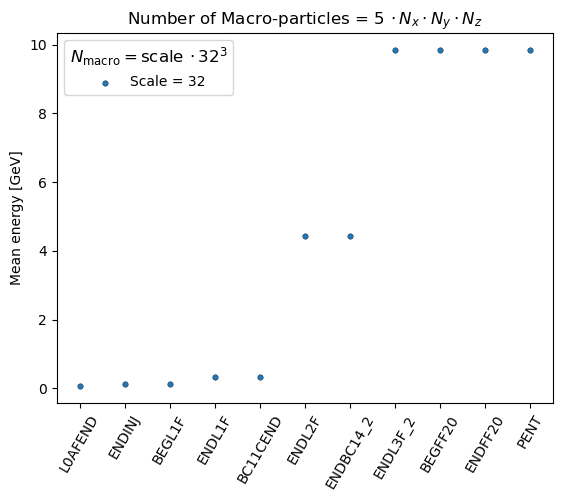

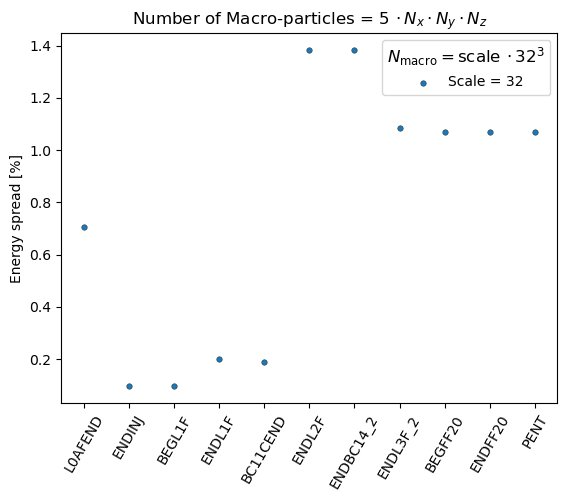

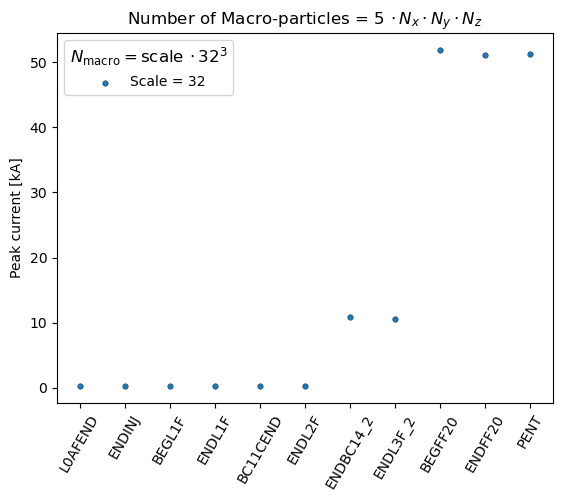

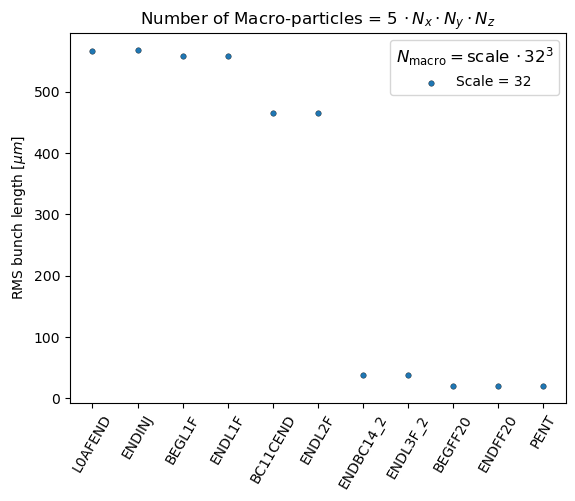

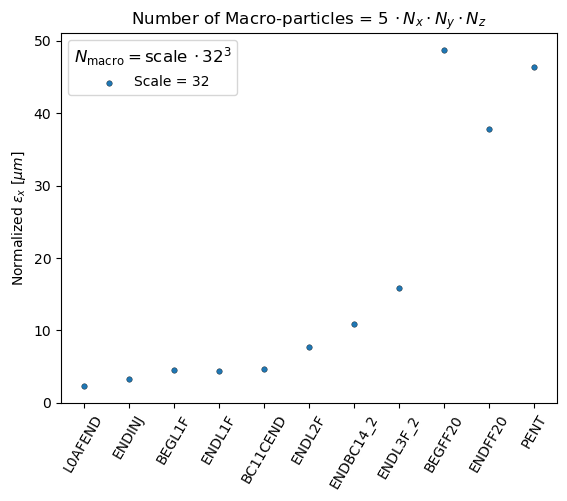

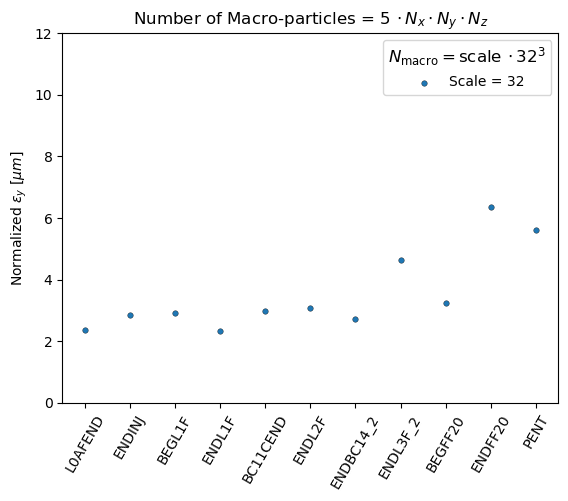

In [7]:
# for scanning Nx,Ny,Nz

scl = 5

for key in results_dict[32]: # just for getting `locations`
    if key != 'location':
        plotScan(results_dict, quantity=key, show=False)
        plt.title(f'Number of Macro-particles = {scl}' + r'$\,\cdot N_x \cdot N_y \cdot N_z$')
        if key == 'emittance_y':
            plt.ylim(0,12)
        plt.show()

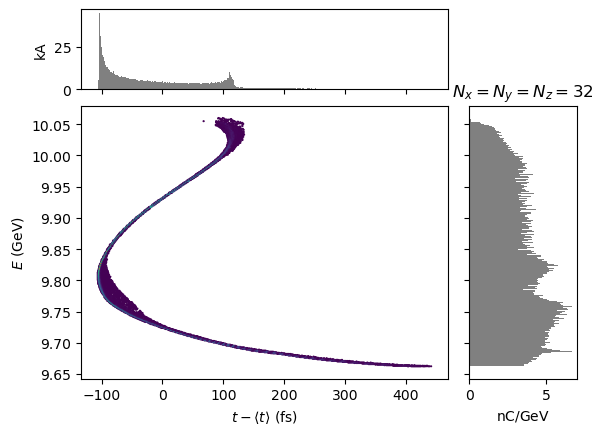

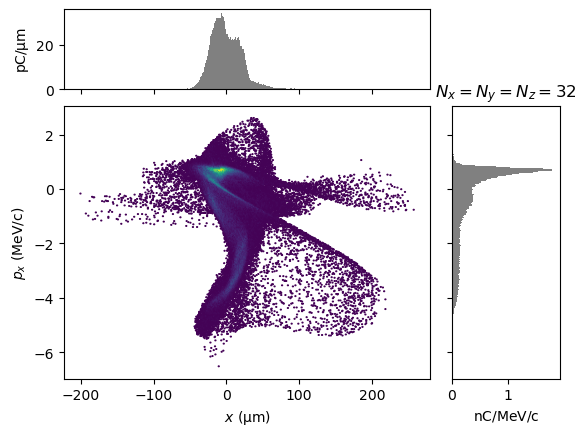

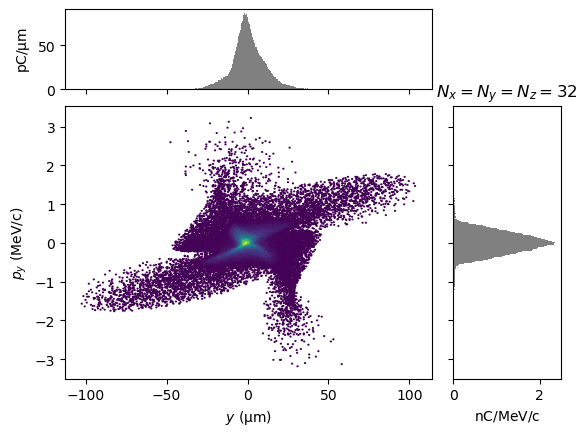

In [8]:
for Nx in [32
           # , 64
          ]:

    pts = pmdResultsFromScan(
        output_path = '/pscratch/sd/m/maxvarv/ConvergenceScan',
        Nx          = Nx,
        scl         = 5,
        location    = 'PENT'
    )
    
    pts.plot('delta_t','energy', bins=400)
    plt.title(r'$N_x=N_y=N_z= $' + f'{Nx}')
    plt.show()
    
    pts.plot('x','px', bins=400)
    plt.title(r'$N_x=N_y=N_z= $' + f'{Nx}')
    plt.show()
    
    pts.plot('y','py', bins=400)
    plt.title(r'$N_x=N_y=N_z= $' + f'{Nx}')
    plt.show()

### Number of macro particles scan

In [11]:
# scl = 5
Nx = 32
scl = [ 1, 2, 4, 5, 8 ]
# scl_done = [ 1, 2, 4, 5 ]
results_dict = {}

# results = {
#                 'location': [],
#                 'energy': np.zeros(11),
#                 'energy spread': np.zeros(11),
#                 'peak current': np.zeros(11),
#                 'blen z': np.zeros(11),
#                 'emittance_x': np.zeros(11),
#                 'emittance_y': np.zeros(11)
#               }

# for s in [8]:
    # results_dict[s] = convergenceScan(output_path='/pscratch/sd/m/maxvarv/ConvergenceScan', Nx=Nx, scl=s)
    # convergenceScan(output_path='/pscratch/sd/m/maxvarv/ConvergenceScan', Nx=32, scl=s)

# for s in scl:
#     convergenceScan(output_path='/pscratch/sd/m/maxvarv/ConvergenceScan', Nx=64, scl=s, results=False)
    
    # if s == 4:
    #     results_dict[5] = resultsFromScan('',
    #                                    output_path = '/pscratch/sd/m/maxvarv/ConvergenceScan',
    #                                    Nx          = Nx,
    #                                    scl         = 5,
    #                                    locations   = ['L0AFEND','ENDINJ','BEGL1F','ENDL1F','BC11CEND','ENDL2F','ENDBC14_2','ENDL3F_2','BEGFF20','ENDFF20','PENT'],
    #                                    write       = False)

for s in scl:
    results_dict[s] = resultsFromScan('',
                                       output_path = '/pscratch/sd/m/maxvarv/ConvergenceScan',
                                       Nx          = Nx,
                                       scl         = s,
                                       locations   = ['L0AFEND','ENDINJ','BEGL1F','ENDL1F','BC11CEND','ENDL2F','ENDBC14_2','ENDL3F_2','BEGFF20','ENDFF20','PENT'],
                                       write       = False)

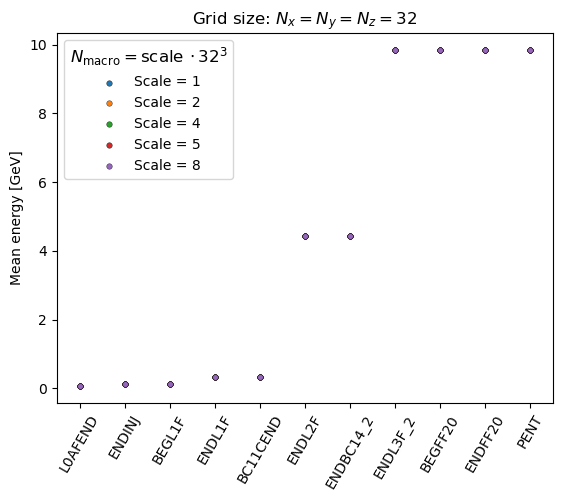

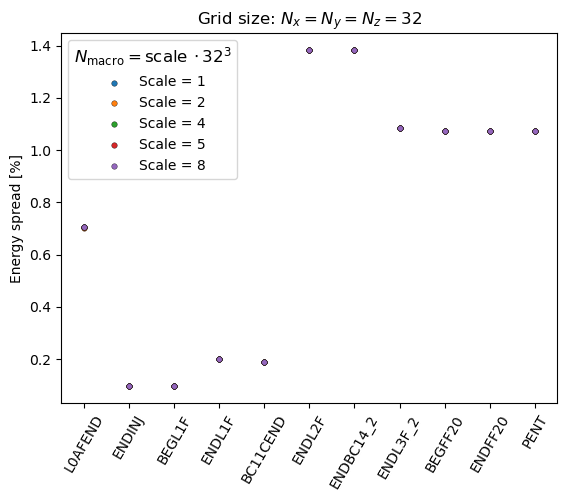

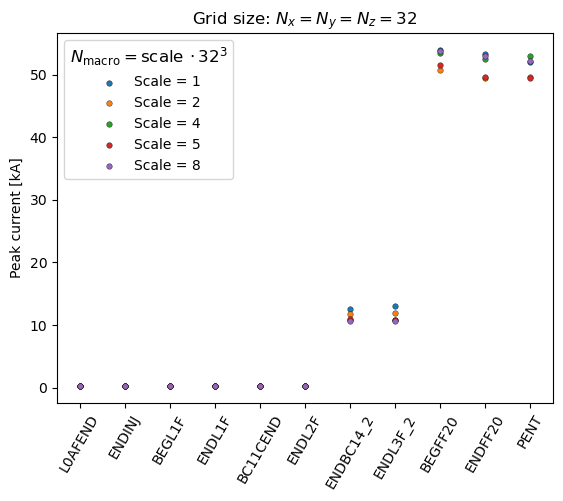

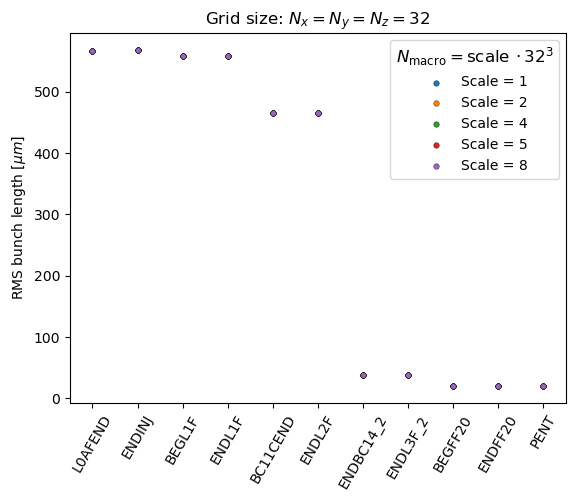

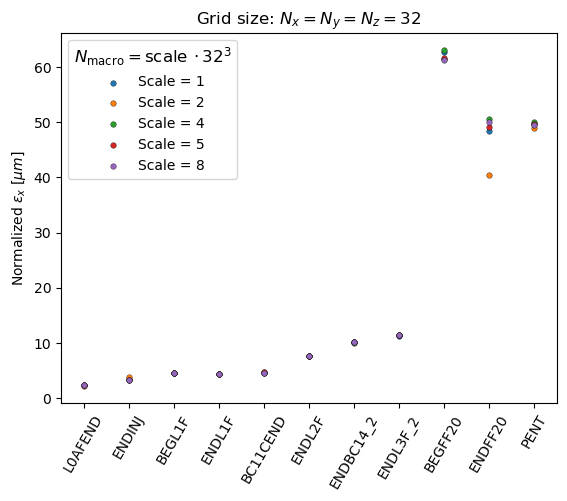

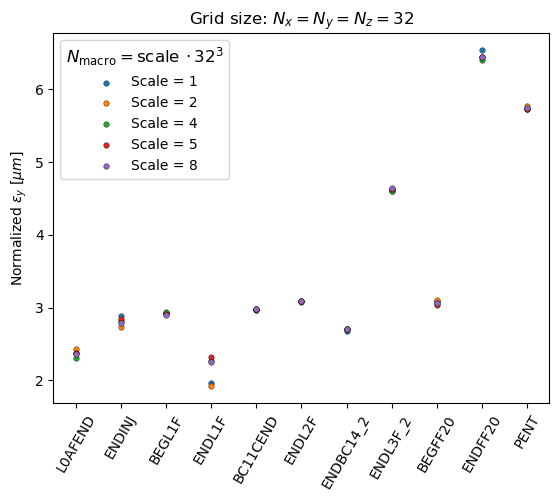

In [12]:
# for scanning number of macro particles

# don't forget to add scl = 5 to results_dict!

for key in results_dict[1]: # just for getting `locations`
    if key != 'location':
        plotScan(results_dict, quantity=key, show=False)
        plt.title(r'Grid size: $N_x = N_y = N_z = 32$')
        plt.show()

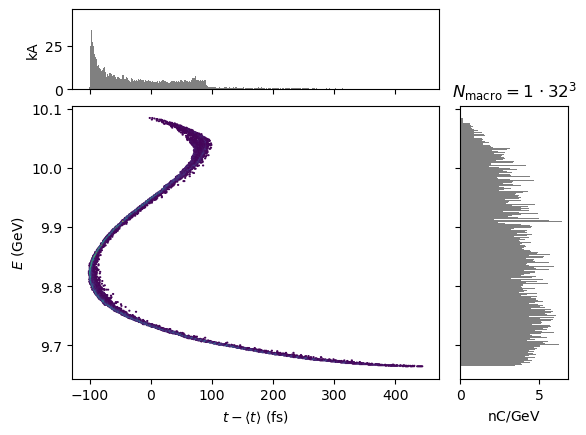

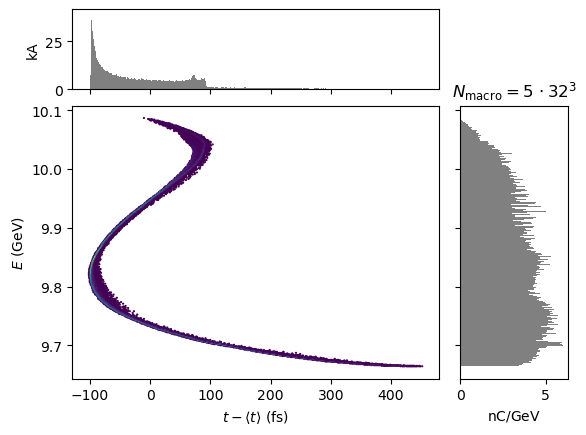

In [13]:
Nx = 32
for s in [1, 5]:

    pts = pmdResultsFromScan(
        output_path = '/pscratch/sd/m/maxvarv/ConvergenceScan',
        Nx          = Nx,
        scl         = s,
        location    = 'PENT'
    )
    
    pts.plot('delta_t','energy', bins=400)
    plt.title(r'$N_{\mathrm{macro}} = $' + f'{s}' + r'$\,\cdot$' f'{Nx}' + r'$^3$')
    plt.show()

### Comparisons to TDR

In [6]:
# currently would need to modify initializeTao() to take ImpactBeamExtName
results = convergenceScan('/pscratch/sd/m/maxvarv/ConvergenceScan', Nx=32, scl=5, ImpactBeamExtName = '32_5')

Environment set to:  /global/u1/m/maxvarv/FACET2-Bmad-PyTao


Installed Tao version is lower than pytao's recommended and tested version. 
   You have Tao version: 2024-09-16
   Recommended version:  2024-11-19
Some features may not work as expected.  Please upgrade bmad.


Tracking to end
CSR on
Overwriting lattice with setLattice() defaults
No defaults file provided to setLattice(). Using setLattice_configs/defaults.yml
Running Impact
	 Impact: Autophasing
	 Impact: Distgen
	 Impact: Tracking
Running Impact-T in /global/u1/m/maxvarv/FACET2-Bmad-PyTao/impact/tmpsvx1w5ka
/global/homes/m/maxvarv/miniforge3/envs/bmad/bin/ImpactTexe
writing 163840 particles to /global/u1/m/maxvarv/FACET2-Bmad-PyTao/impact/tmpsvx1w5ka/partcl.data
Cathode start with cathode_kinetic_energy_ref = 1.0 eV
Cathode start: Replaced Np with 163840 according to initial particles
Cathode start: Replaced Bkenergy with 1.0 according to initial particles
Cathode start: Replaced Temission with 7.015747117006533e-12 according to initial particles
Cathode start: Replaced Tini with -3.5085417586726863e-12 according to initial particles
Setting total charge to 1.5999999999999996e-09 C
 !-----------------------------------------------------------
 ! IMPACT-T Parallel Beam Dynamics Tracking Code:

/global/u1/m/maxvarv/FACET2-Bmad-PyTao/UTILITY_quickstart.py:446: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(sigmax**2 + 2 * z * rho * sigmax * sigmaxp + z**2 * sigmaxp**2)


In [ ]:
path_conda = '/global/homes/m/maxvarv/miniforge3/envs/bmad/bin/'
ImpactBeamExtName = '1.6e5_2'

I = runImpact(
    impactGridCount = 32,
    numMacroParticles = 5 * 32**3,
    # GFILESuffix = '../beams/2024-12-11_Impact_OneBunch/Source/impact/2024-10-22_distgen_onebunch.yaml',
    GFILESuffix = '2024-10-22_distgen_onebunch.yaml',
    L0APhaseOffset = 0,
    solenoidTValue = -0.41,
    returnImpactObject = True,
    command = path_conda + 'ImpactTexe',    
    command_mpi = path_conda + 'ImpactTexe-mpi',
    mpi_run = '/global/u1/m/maxvarv/miniforge3/envs/bmad/bin/mpirun --map-by :OVERSUBSCRIBE -n {nproc} {command_mpi}',
    ImpactBeamExtName = ImpactBeamExtName,
)

In [7]:
# P = I.particles['L0AFEND'].copy()
# P = ParticleGroup(f"./beams/ImpactBeam.h5")
P = ParticleGroup(f"./beams/ImpactBeam32_5.h5")
# P = ParticleGroup(f"./beams/ImpactBeam{ImpactBeamExtName}.h5")
# P = ParticleGroup(f"./beams/ImpactBeam1.6e5_2.h5")
# P = ParticleGroup("./beams/2024-10-22_Impact_OneBunch/2024-10-22_oneBunch.h5")

In [8]:
P.twiss()

{'alpha_x': np.float64(-14.854123926870386),
 'beta_x': np.float64(57.5498242513902),
 'gamma_x': np.float64(3.8513583754249106),
 'emit_x': np.float64(3.5047377351327595e-08),
 'eta_x': np.float64(-3.594364236232958e-06),
 'etap_x': np.float64(-6.534977273264965e-07),
 'norm_emit_x': np.float64(4.706447927209658e-06)}

In [9]:
P["mean_t"]

np.float64(-3.8467031247750556e-24)

In [10]:
P["mean_z"]

np.float64(0.0)

In [41]:
tao = initializeTao(
                    inputBeamFilePathSuffix = '/beams/2024-10-22_Impact_OneBunch/2024-10-22_oneBunch.h5',
                    # inputBeamFilePathSuffix = f'/beams/ImpactBeam{ImpactBeamExtName}.h5',
                    GFILESuffix = '2024-10-22_distgen_onebunch.yaml',
                    csrTF = True,
                    runImpactTF = False,
                )

setLattice(tao, **importedDefaultSettings)
trackBeam(tao, **importedDefaultSettings)

results = resultsFromScan(
                            tao,
                            output_path = '/pscratch/sd/m/maxvarv/ConvergenceScan',
                            Nx          = 32, # it was really 100 though since it's inherited from '/beams/2024-10-22_Impact_OneBunch/2024-10-22_oneBunch.h5'
                            scl         = '1e5_oneBunch',
                            locations   = ['L0AFEND','ENDINJ','BEGL1F','ENDL1F','BC11CEND','ENDL2F','ENDBC14_2','ENDL3F_2','BEGFF20','ENDFF20','PENT'],
                            write       = True
                         )

Environment set to:  /global/u1/m/maxvarv/FACET2-Bmad-PyTao


Installed Tao version is lower than pytao's recommended and tested version. 
   You have Tao version: 2024-09-16
   Recommended version:  2024-11-19
Some features may not work as expected.  Please upgrade bmad.


Tracking to end
CSR on
Overwriting lattice with setLattice() defaults
No defaults file provided to setLattice(). Using setLattice_configs/defaults.yml
Number of macro particles defined by input file


In [16]:
results = resultsFromScan(
                            '',
                            output_path = '/pscratch/sd/m/maxvarv/Check_32_5_against_2024-22-10_oneBunch/',
                            Nx          = 32,
                            scl         = 5, #'1e5_oneBunch', #'5_old', #'1e5_oneBunch', #3.05,
                            locations   = ['L0AFEND','ENDINJ','BEGL1F','ENDL1F','BC11CEND','ENDL2F','ENDBC14_2','ENDL3F_2','BEGFF20','ENDFF20','PENT'],
                            write       = False
                         )

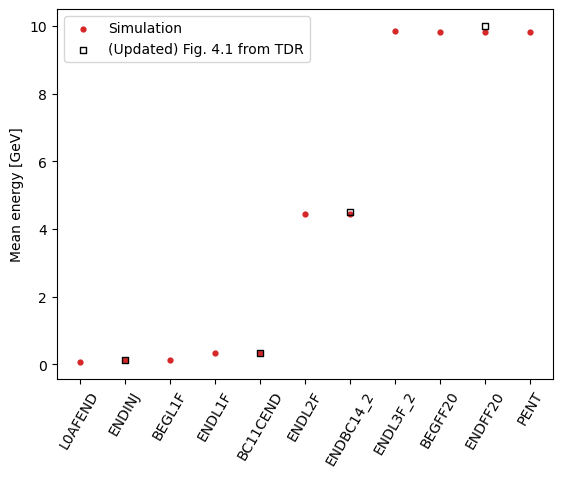

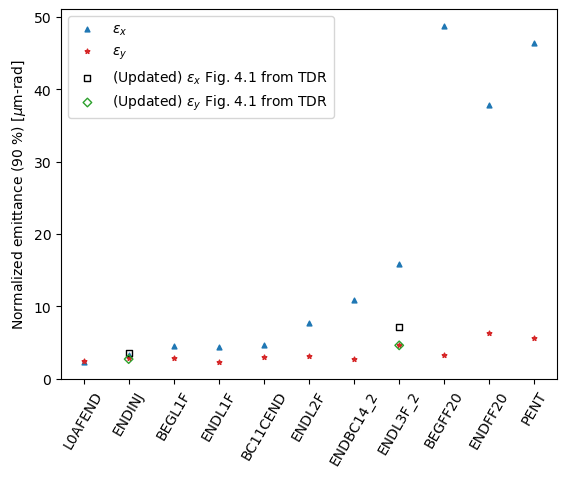

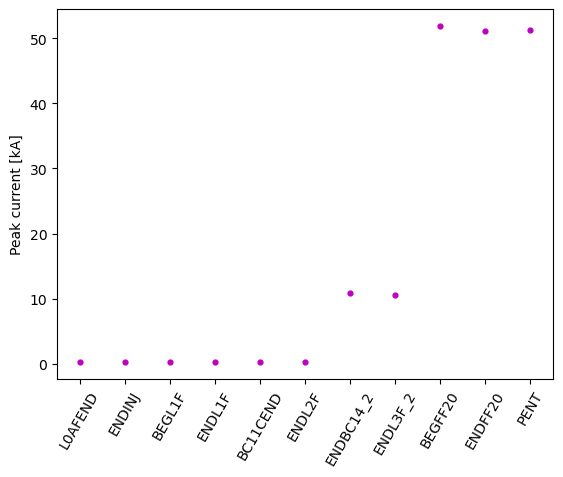

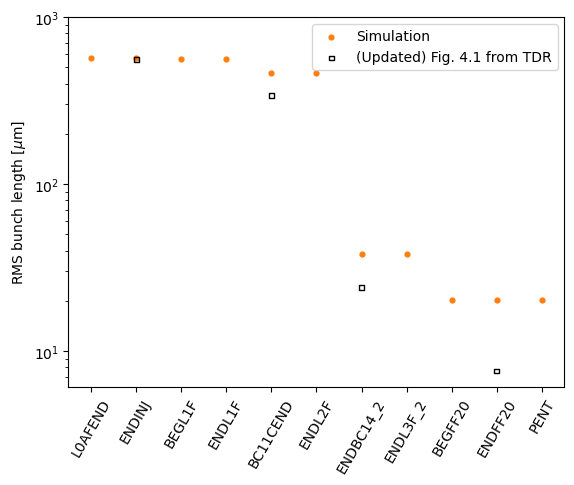

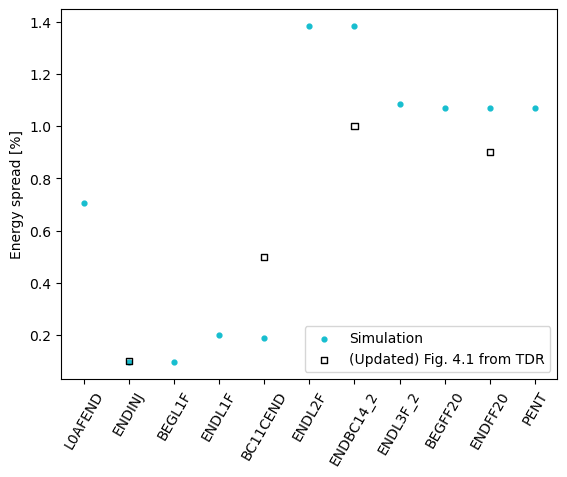

In [10]:
sz = 12

plt.xticks(rotation=60)
plt.scatter(results['location'], results['energy']*1e-9, s=sz, c='tab:red')
plt.scatter([key for key in compare_energy.keys()], [val*1e-9 for val in compare_energy.values()], s=sz+7, marker='s', edgecolors='k', facecolor='none')
plt.ylabel('Mean energy [GeV]')
plt.legend(['Simulation','(Updated) Fig. 4.1 from TDR'])
plt.show()

plt.xticks(rotation=60)
plt.scatter(results['location'], results['emittance_x']*1e6, s=sz, c='tab:blue', marker='^')
plt.scatter(results['location'], results['emittance_y']*1e6, s=sz, c='tab:red', marker='*')
plt.scatter([key for key in compare_emittance.keys()], [val['x']*1e6 for val in compare_emittance.values()], s=sz+7, marker='s', edgecolors='k', facecolor='none')
plt.scatter([key for key in compare_emittance.keys()], [val['y']*1e6 for val in compare_emittance.values()], s=sz+7, marker='D', edgecolors='tab:green', facecolor='none')
plt.legend([r'$\varepsilon_x$',r'$\varepsilon_y$',r'(Updated) $\varepsilon_x$ Fig. 4.1 from TDR',r'(Updated) $\varepsilon_y$ Fig. 4.1 from TDR'])
plt.ylabel(r'Normalized emittance (90 %) [$\mu$m-rad]')
plt.show()

plt.xticks(rotation=60)
plt.scatter(results['location'], results['peak current']*1e-3, s=sz, c='m')
plt.ylabel('Peak current [kA]')
plt.show()

plt.xticks(rotation=60)
plt.scatter(results['location'], results['sigma_z']*1e6, s=sz, c='tab:orange')
plt.scatter([key for key in compare_z.keys()], [val*1e6 for val in compare_z.values()], s=sz, marker='s', edgecolors='k', facecolor='none')
plt.ylabel(r'RMS bunch length [$\mu$m]')
plt.yscale('log')
plt.yticks([10, 100, 1000])
# plt.legend(['np.std(pts.z)','smallestIntervalImpliedSigma','TDR'])
plt.legend(['Simulation','(Updated) Fig. 4.1 from TDR'])
plt.show()

plt.xticks(rotation=60)
plt.scatter(results['location'], results['energy spread']*1e2, s=sz, c='tab:cyan')
plt.scatter([key for key in compare_e_spread.keys()], [val*1e2 for val in compare_e_spread.values()], s=sz+7, marker='s', edgecolors='k', facecolor='none')
plt.ylabel(r'Energy spread [%]')
plt.legend(['Simulation','(Updated) Fig. 4.1 from TDR']
           # , loc='upper left'
          )
plt.show()

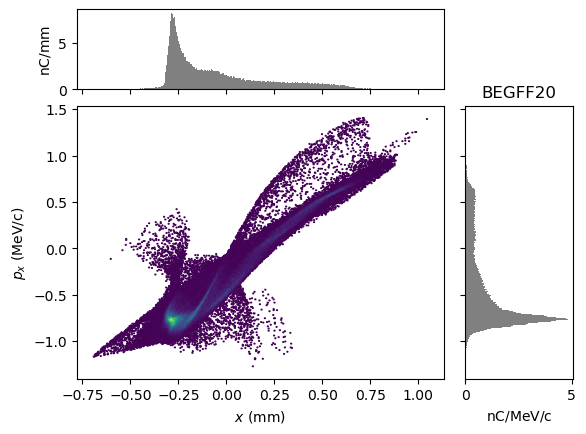

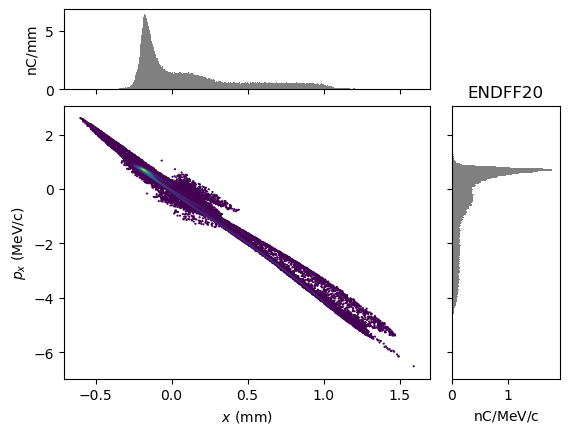

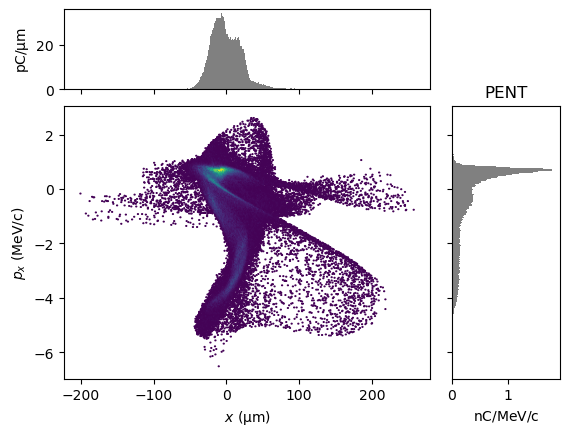

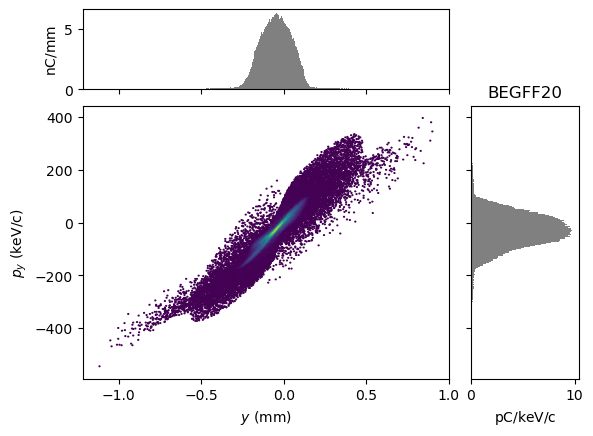

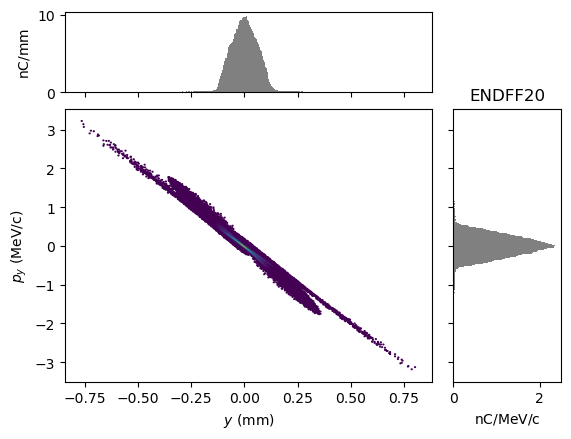

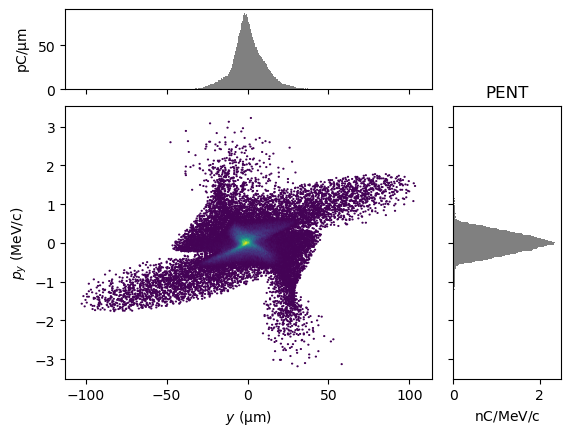

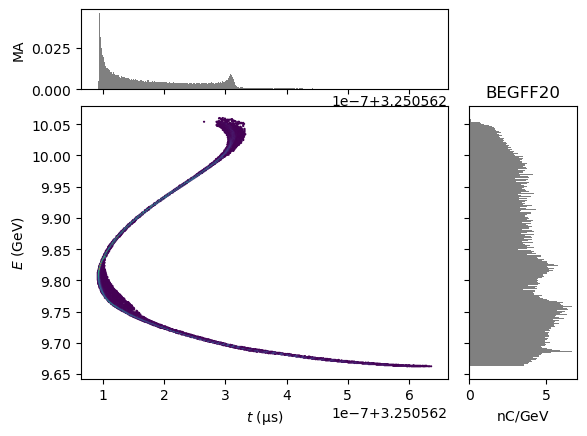

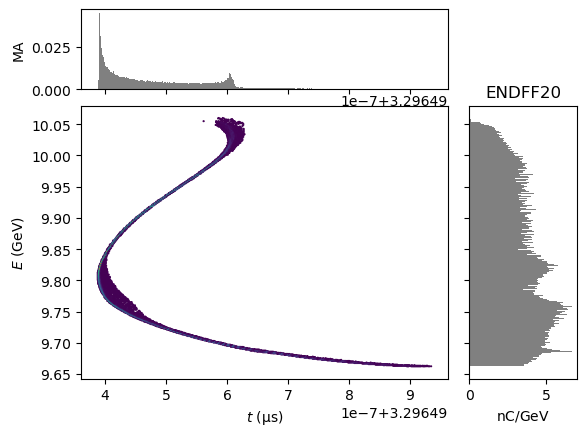

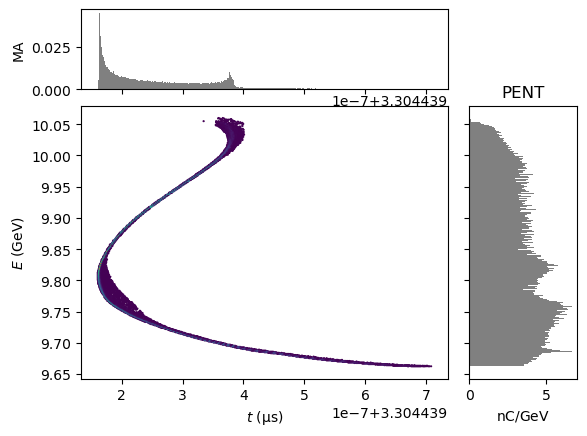

In [18]:
for location in ['BEGFF20','ENDFF20','PENT']:
    pts = pmdResultsFromScan(
        output_path = '/pscratch/sd/m/maxvarv/ConvergenceScan',
        Nx          = 32,
        scl         = 5,
        location    = location
    )
    pts.plot('x','px', bins=400)
    plt.title(location)
    plt.show()

for location in ['BEGFF20','ENDFF20','PENT']:
    pts = pmdResultsFromScan(
        output_path = '/pscratch/sd/m/maxvarv/ConvergenceScan',
        Nx          = 32,
        scl         = 5,
        location    = location
    )
    pts.plot('y','py', bins=400)
    plt.title(location)
    plt.show()

for location in ['BEGFF20','ENDFF20','PENT']:
    pts = pmdResultsFromScan(
        output_path = '/pscratch/sd/m/maxvarv/ConvergenceScan',
        # output_path = '/pscratch/sd/m/maxvarv/Check_32_5_against_2024-22-10_oneBunch/',
        Nx          = 32,
        scl         = 5,
        location    = location
    )
    pts.plot('t','energy', bins=400)
    plt.title(location)
    plt.show()

### Comparing $10^5$ vs $5\cdot 32^3$ macro partcle impact-T simulation emittances

In [15]:
results1b = resultsFromScan(
                            '',
                            output_path = '/pscratch/sd/m/maxvarv/NewConvergenceScan/',
                            Nx          = 32,
                            scl         = 5, #'5_old', #'1e5_oneBunch', #3.05,
                            locations   = ['L0AFEND','ENDINJ','BEGL1F','ENDL1F','BC11CEND','ENDL2F','ENDBC14_2','ENDL3F_2','BEGFF20','ENDFF20','PENT'],
                            write       = False
                         )

results325 = resultsFromScan(
                            '',
                            output_path = '/pscratch/sd/m/maxvarv/ConvergenceScan/',
                            Nx          = 32,
                            scl         = 5, #'1e5_oneBunch', #3.05,
                            locations   = ['L0AFEND','ENDINJ','BEGL1F','ENDL1F','BC11CEND','ENDL2F','ENDBC14_2','ENDL3F_2','BEGFF20','ENDFF20','PENT'],
                            write       = False
                         )

In [6]:
results1b = resultsFromScan(
                            '',
                            output_path = '/pscratch/sd/m/maxvarv/Check_32_5_against_2024-22-10_oneBunch/',
                            Nx          = 32,
                            scl         = '1e5_oneBunch', #'5_old', #'1e5_oneBunch', #3.05,
                            locations   = ['L0AFEND','ENDINJ','BEGL1F','ENDL1F','BC11CEND','ENDL2F','ENDBC14_2','ENDL3F_2','BEGFF20','ENDFF20','PENT'],
                            write       = False
                         )

results325 = resultsFromScan(
                            '',
                            output_path = '/pscratch/sd/m/maxvarv/ConvergenceScan/',
                            Nx          = 32,
                            scl         = 5, #'1e5_oneBunch', #3.05,
                            locations   = ['L0AFEND','ENDINJ','BEGL1F','ENDL1F','BC11CEND','ENDL2F','ENDBC14_2','ENDL3F_2','BEGFF20','ENDFF20','PENT'],
                            write       = False
                         )

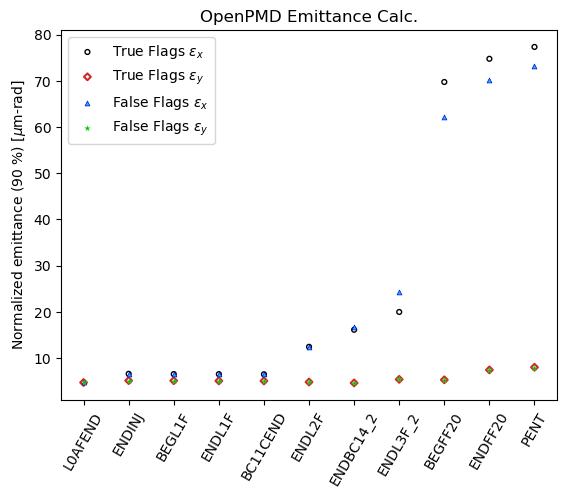

In [16]:
sz = 12

plt.xticks(rotation=60)
plt.scatter(results325['location'], results325['pmd_emittance_x']*1e6, s=sz, edgecolors='k', marker='o', facecolors='None')
plt.scatter(results325['location'], results325['pmd_emittance_y']*1e6, s=sz, edgecolors='tab:red', marker='D', facecolors='None', linewidth=1.5)
plt.scatter(results1b['location'], results1b['pmd_emittance_x']*1e6, s=sz, edgecolors='b', facecolors='tab:cyan', marker='^', linewidth=0.5)
plt.scatter(results1b['location'], results1b['pmd_emittance_y']*1e6, s=sz+5, edgecolors='lime', facecolors='tab:green', marker='*', linewidth=0.25)
# plt.scatter([key for key in compare_emittance.keys()], [val['x']*1e6 for val in compare_emittance.values()], s=sz+7, marker='s', edgecolors='k', facecolor='none')
# plt.scatter([key for key in compare_emittance.keys()], [val['y']*1e6 for val in compare_emittance.values()], s=sz+7, marker='D', edgecolors='tab:green', facecolor='none')

# plt.legend([r'($5\cdot 32^3$ macro) $\varepsilon_x$',r'($5\cdot 32^3$ macro) $\varepsilon_y$',r'($10^5$ macro) $\varepsilon_x$',r'($10^5$ macro) $\varepsilon_y$'])
plt.legend([r'True Flags $\varepsilon_x$',r'True Flags $\varepsilon_y$',r'False Flags $\varepsilon_x$',r'False Flags $\varepsilon_y$'])
plt.ylabel(r'Normalized emittance (90 %) [$\mu$m-rad]')
plt.title('OpenPMD Emittance Calc.')
plt.show()